This notebook is composed of 2 parts, one about the corrupted EMNIST dataset, and the othe one studying GAN mode collapse on the MNIST dataset.

We created this notebook as part of a GitHub repository. If you want to run it and load the data, you can clone the following repository: https://github.com/matthieudelsart/denoising_emnist


# I. Anomaly detection on corrupted EMNIST

## 1. Load and visualize the data

In [1]:
# Adapt according to where the dataset is and where you run this from

# On colab:
from google.colab import drive
drive.mount('/content/drive')

import os
import sys
import zipfile
import numpy as np
import matplotlib.pyplot as plt
import torch

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

sys.path.append('/content/drive/MyDrive/DSB/2A HEC/Unsupervised DL/denoising_emnist')
os.chdir('/content/drive/MyDrive/DSB/2A HEC/Unsupervised DL/denoising_emnist')

def load_images_from_zip(zip_filename='data/corrupted_emnist.zip'):
    """
    Load a numpy array from a .zip archive containing a .npz file.

    Args:
        zip_filename (str): The name of the .zip file to read.

    Returns:
        numpy.ndarray: The loaded array.
    """
    with zipfile.ZipFile(zip_filename, 'r') as zipf:
        npz_filename = zipf.namelist()[0]  # Get the name of the .npz file
        zipf.extract(npz_filename, path='data')  # Extract the .npz file
    data = np.load("data/" + npz_filename)['all_imagesfinal']  # Load the array
    return data / 255.0  # Normalize the pixel values

corrupted_emnist = load_images_from_zip()
corrupted_emnist = corrupted_emnist.astype(np.float32)

# On the github repo:
# import utils
# loaded_images = utils.load_images_from_zip()

Mounted at /content/drive


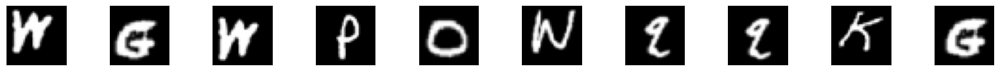

In [2]:
# Visualization functions (adapted from class notebooks)

def to_img(x, base_dim=32):
    "Displays array as an image."
    if isinstance(x, torch.Tensor):
        x = x.cpu().data.numpy()
    x = np.clip(x, 0, 1)
    x = x.reshape([-1, base_dim, base_dim])
    return x

def plot_images(data, base_dim=32, labels=None):
    """
    Plots the images to visualize many of them at once.
    """
    # Convert to numpy
    if isinstance(data, torch.Tensor):
        data = data.cpu().detach().numpy()

    true_imgs = data
    true_imgs = to_img(true_imgs, base_dim=base_dim)

    n = 10  # Number of images to display at the same time
    for j in range(0, len(data), 10):
        plt.figure(figsize=(20, 4))
        for i in range(n):
            if i+j >= len(data):
                break
            # Display original images
            ax = plt.subplot(3, n, i + 1)
            plt.imshow(true_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            if labels is not None:
                ax.set_title(str(labels[i + j]), fontsize=10, color='black', pad=5)

plot_images(corrupted_emnist[:10])

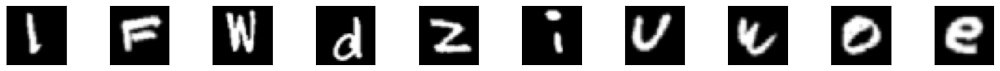

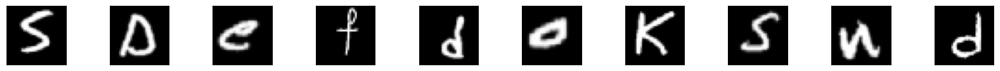

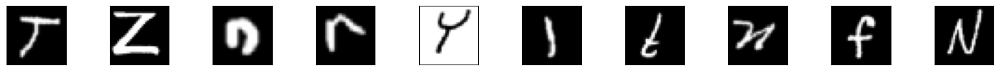

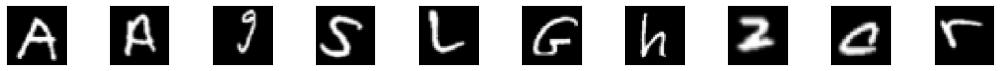

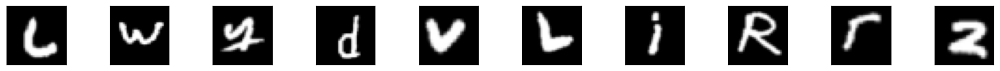

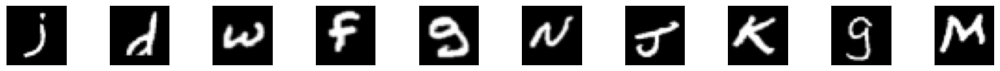

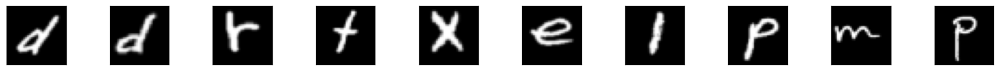

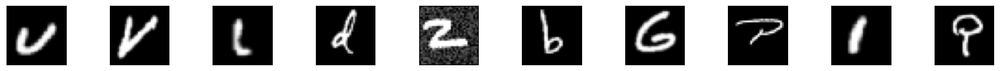

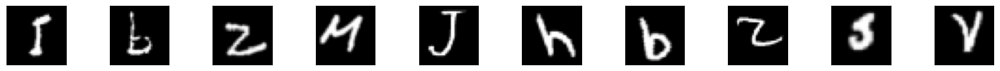

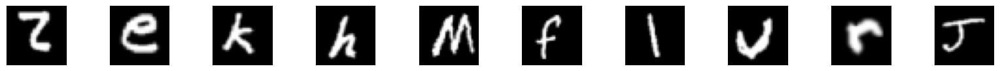

In [3]:
# Vizualize a lot of images to identify the different types of corruption

indexes = np.random.choice(len(corrupted_emnist), 100, replace=False)
data = torch.tensor(corrupted_emnist[indexes]).float().to(device)
plot_images(data)

If we repeat this operation a lot of type, we are able to see at least 5 types of corruptions:

 - white squares
 - reversed colors
 - interpolations between different images
 - noise added
 - 4 images merged in one

Some images also seem to have undergoned other modifications, but it is possible that these were already in the EMNIST original dataset:

 - inversion
 - rotation

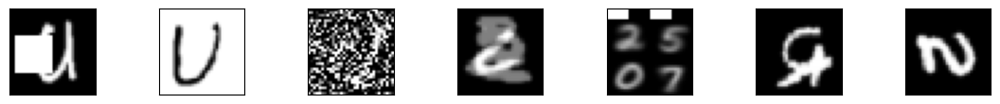

In [4]:
# A few examples

examples_corruptions = [80189,  80009,   7577,  59775, 108725, 88270, 119131]
plot_images(corrupted_emnist[examples_corruptions])

By looking visually at a lot of images, we estimate there are about 1-3% of corrupted images in the entire dataset.

## 2. Autoencoder

Our first trials were autoencoders. Our hope was that the reconstruction loss would enable us to identify the corrupted instances (a corrupted instance should have a higher reconstruction loss)

In [5]:
# Preparing data
from sklearn.model_selection import train_test_split
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset

corrupted_emnist_nn = torch.tensor(
    np.reshape(corrupted_emnist, (len(corrupted_emnist), 32 * 32)),
    device=device,
    dtype=torch.float32
    )
data_train, data_test = train_test_split(corrupted_emnist_nn, test_size=0.2, random_state=42)

train_loader = torch.utils.data.DataLoader(data_train, batch_size=256, shuffle=True)
test_loader = torch.utils.data.DataLoader(data_test, batch_size=256, shuffle=False)


We start with a simple autoencoder. We rely on the architecture from this [Medium post](https://medium.com/@weidagang/demystifying-anomaly-detection-with-autoencoder-neural-networks-1e235840d879), which explores anomaly detection on the MNIST dataset with autoencoders. We adapted the code for the corrupted EMNIST (32x32 instead of 28x28 pixels) and from tensforflow/keras to pytorch.

In [6]:
class AutoEncoder(nn.Module):
    def __init__(self, input_dim=data_train.shape[1]):
        super(AutoEncoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU()
        )

        self.decoder = nn.Sequential(
            nn.Linear(32, 64),
            nn.ReLU(),
            nn.Linear(64, 128),
            nn.ReLU(),
            nn.Linear(128, input_dim),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

def train_model(model, loss_fn, data_loader=None, epochs=10, optimizer=None):
    model.train()
    for epoch in range(epochs):
        for batch_idx, data in enumerate(train_loader):
            optimizer.zero_grad()
            output = model(data)
            loss = loss_fn(output, data)
            loss.backward()
            optimizer.step()
            if batch_idx % 100 == 0:
                print('Train Epoch: {} [{}/{} ({:.0f}%)]\tLoss: {:.6f}'.format(
                    epoch, batch_idx * len(data), len(data_loader.dataset),
                    100. * batch_idx / len(data_loader), loss.data.item()))


In [8]:
model = AutoEncoder()
model = model.to(device)

optimizer = optim.Adam(model.parameters())
loss_fn = torch.nn.MSELoss()

train_model(model, loss_fn, data_loader=train_loader, epochs=20, optimizer=optimizer)

Train Epoch: 0 [0/104845 (0%)]	Loss: 0.224051
Train Epoch: 0 [25600/104845 (24%)]	Loss: 0.069660
Train Epoch: 0 [51200/104845 (49%)]	Loss: 0.061719
Train Epoch: 0 [76800/104845 (73%)]	Loss: 0.053779
Train Epoch: 0 [102400/104845 (98%)]	Loss: 0.051365
Train Epoch: 1 [0/104845 (0%)]	Loss: 0.051323
Train Epoch: 1 [25600/104845 (24%)]	Loss: 0.043562
Train Epoch: 1 [51200/104845 (49%)]	Loss: 0.041802
Train Epoch: 1 [76800/104845 (73%)]	Loss: 0.037978
Train Epoch: 1 [102400/104845 (98%)]	Loss: 0.036273
Train Epoch: 2 [0/104845 (0%)]	Loss: 0.035951
Train Epoch: 2 [25600/104845 (24%)]	Loss: 0.035459
Train Epoch: 2 [51200/104845 (49%)]	Loss: 0.030915
Train Epoch: 2 [76800/104845 (73%)]	Loss: 0.031644
Train Epoch: 2 [102400/104845 (98%)]	Loss: 0.027836
Train Epoch: 3 [0/104845 (0%)]	Loss: 0.030189
Train Epoch: 3 [25600/104845 (24%)]	Loss: 0.028237
Train Epoch: 3 [51200/104845 (49%)]	Loss: 0.027556
Train Epoch: 3 [76800/104845 (73%)]	Loss: 0.026737
Train Epoch: 3 [102400/104845 (98%)]	Loss: 0.026

In [10]:
# Function to visualize reconstructions (coming from class notebooks)

def plot_reconstructions(model, data, base_dim=32):
    """
    Plot reconstructions from a dataset set.
    The top row is the original digits,
    the middle row is the encoded vector,
    and the bottom row is the decoder reconstruction.
    """

    true_imgs = data
    # Encode and then decode the images
    encoded_imgs = model.encoder(data)
    decoded_imgs = model.decoder(encoded_imgs)

    # Convert images for plotting
    true_imgs = to_img(true_imgs, base_dim=base_dim)
    decoded_imgs = to_img(decoded_imgs, base_dim=base_dim)
    encoded_imgs = encoded_imgs.cpu().data.numpy()

    n = 10  # Number of images to display at the same time
    for j in range(0, len(data), 10):
        plt.figure(figsize=(20, 4))
        for i in range(n):
            if i+j >= len(data):
                break
            # Display original images
            ax = plt.subplot(3, n, i + 1)
            plt.imshow(true_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display encoded representations
            ax = plt.subplot(3, n, i + 1 + n)
            plt.imshow(encoded_imgs[i + j].reshape(-1, 4))
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display reconstructed images
            ax = plt.subplot(3, n, i + 1 + 2 * n)
            plt.imshow(decoded_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)


In [11]:
data_viz = next(iter(test_loader))
plot_reconstructions(model, data_viz)

Output hidden; open in https://colab.research.google.com to view.

Although some images are blurry, our auto encoder seems satisfactory. However, we see that is reconstructs corrupted images as well, for example:

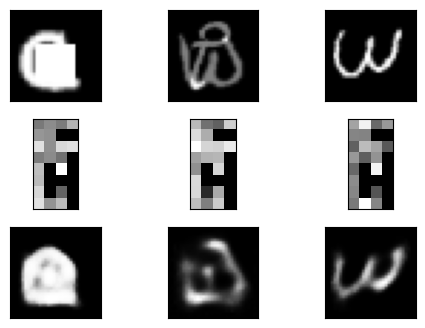

In [13]:
plot_reconstructions(model, data_viz[[1, 9, 231]])

Looking at reconstruction losses:

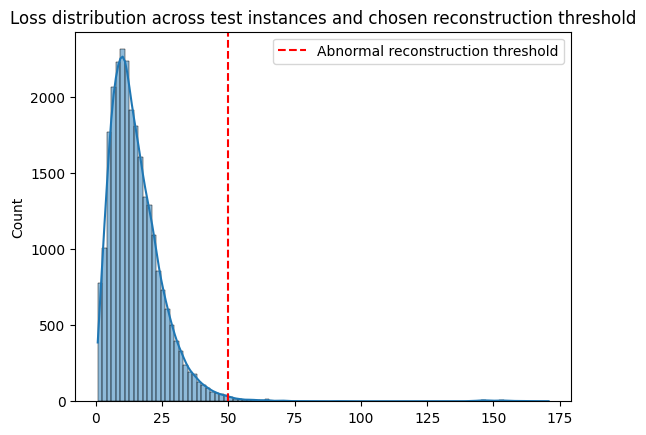

In [18]:
# Visualize the loss distribution

import seaborn as sns

eval_loss = torch.nn.MSELoss(reduction='none')
losses = eval_loss(model(data_test), data_test).sum(axis=1).detach().cpu().numpy()

threshold = 50 # This is set visually
sns.histplot(losses, bins=100, kde=True)
plt.axvline(x=threshold, color='r', linestyle='--', label='Abnormal reconstruction threshold')
plt.title('Loss distribution across test instances and chosen reconstruction threshold')
plt.legend()
plt.show()

torch.Size([57, 1024])


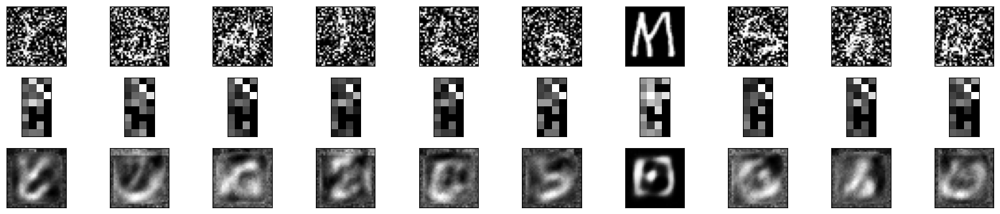

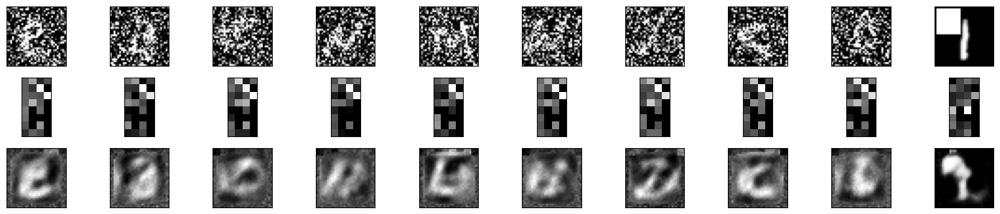

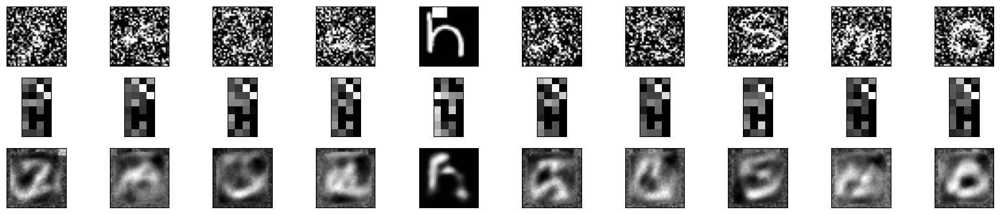

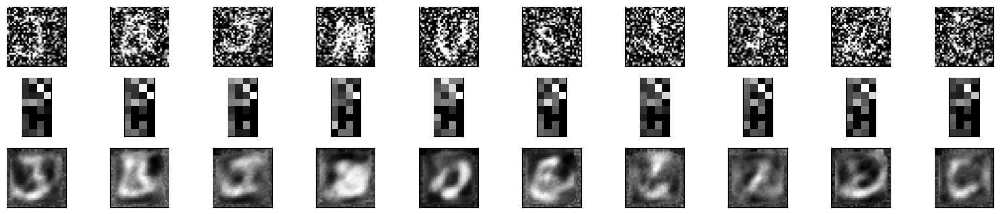

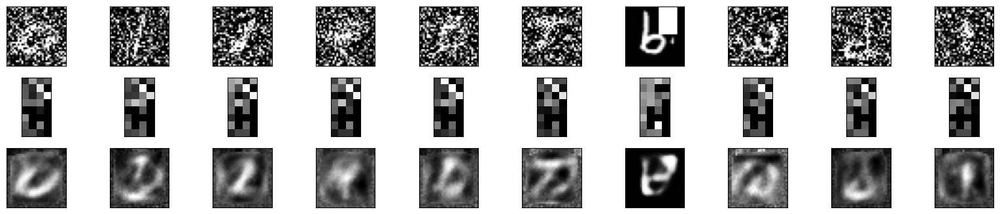

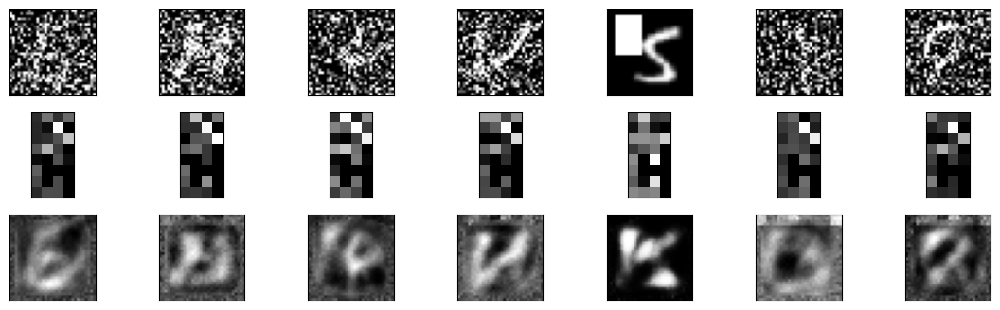

In [19]:
mask = losses > 80
outliers = data_test[mask]
print(outliers.shape)
plot_reconstructions(model, outliers)

Almost all the instances identified as "reconstruction outliers" are indeed corrupted. However, they almost all belong to the same type of corruption : added noise. This is not so surprising as we saw that other types of corruptions, such as "4 images at once" and the "negative colors" were well reconstructed. This means that we are missing other types of corruption and we should try another approach.

## 3. Convolutional autoencoder

To allow the model to better "see", we implemented a convolutional autoencoder, for which we took the inspiration from [this blog](https://www.geeksforgeeks.org/implement-convolutional-autoencoder-in-pytorch-with-cuda/)

In [23]:
class Reshape(nn.Module):
    def __init__(self, *args):
        super(Reshape, self).__init__()
        self.shape = args

    def forward(self, x):
        return x.view(*self.shape)


class Autoencoder(nn.Module):
    def __init__(self, input_dim=data_train.shape[1]):
        super(Autoencoder, self).__init__()
        self.img_size = int(np.sqrt(input_dim))

        # Encoder
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 16, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Conv2d(16, 8, kernel_size=3, stride=1, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            nn.Flatten(),
            nn.Linear(8 * (self.img_size//4) * (self.img_size//4), 32),
            nn.ReLU()
        )

        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(32, 8 * (self.img_size//4) * (self.img_size//4)),
            nn.ReLU(),
            Reshape(-1, 8, self.img_size//4, self.img_size//4),
            nn.ConvTranspose2d(8, 16,
                              kernel_size=3,
                              stride=2,
                              padding=1,
                              output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(16, 1,
                              kernel_size=3,
                              stride=2,
                              padding=1,
                              output_padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        if len(x.shape) == 2:
            x = x.view(-1, 1, self.img_size, self.img_size)
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded.view(-1, self.img_size * self.img_size)

In [24]:
model = Autoencoder()
model = model.to(device)

optimizer = optim.Adam(model.parameters())
loss_fn = torch.nn.MSELoss()

In [25]:
train_model(model, loss_fn, data_loader=train_loader, epochs=10, optimizer=optimizer)

Train Epoch: 0 [0/104845 (0%)]	Loss: 0.224321
Train Epoch: 0 [25600/104845 (24%)]	Loss: 0.069919
Train Epoch: 0 [51200/104845 (49%)]	Loss: 0.057669
Train Epoch: 0 [76800/104845 (73%)]	Loss: 0.052469
Train Epoch: 0 [102400/104845 (98%)]	Loss: 0.040497
Train Epoch: 1 [0/104845 (0%)]	Loss: 0.043619
Train Epoch: 1 [25600/104845 (24%)]	Loss: 0.037797
Train Epoch: 1 [51200/104845 (49%)]	Loss: 0.033685
Train Epoch: 1 [76800/104845 (73%)]	Loss: 0.028826
Train Epoch: 1 [102400/104845 (98%)]	Loss: 0.025035
Train Epoch: 2 [0/104845 (0%)]	Loss: 0.023524
Train Epoch: 2 [25600/104845 (24%)]	Loss: 0.023354
Train Epoch: 2 [51200/104845 (49%)]	Loss: 0.022761
Train Epoch: 2 [76800/104845 (73%)]	Loss: 0.022063
Train Epoch: 2 [102400/104845 (98%)]	Loss: 0.021457
Train Epoch: 3 [0/104845 (0%)]	Loss: 0.020381
Train Epoch: 3 [25600/104845 (24%)]	Loss: 0.019698
Train Epoch: 3 [51200/104845 (49%)]	Loss: 0.019877
Train Epoch: 3 [76800/104845 (73%)]	Loss: 0.018323
Train Epoch: 3 [102400/104845 (98%)]	Loss: 0.018

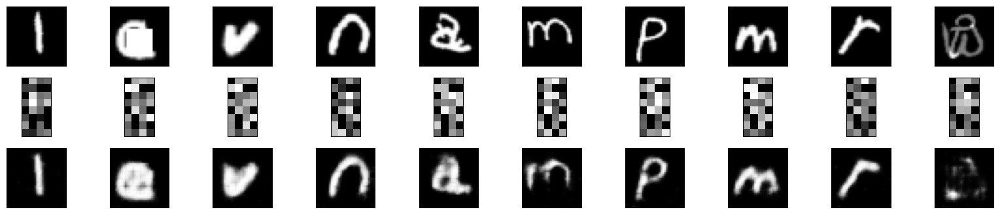

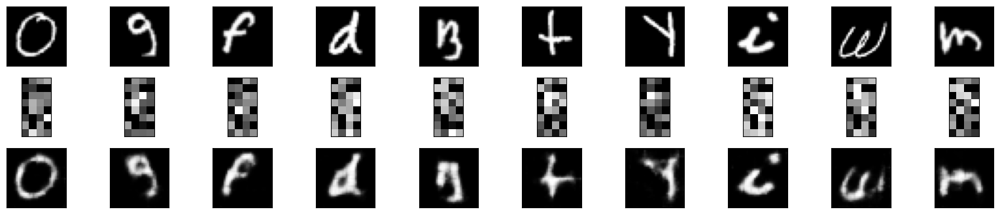

In [29]:
# Adapt reconstruction function to convolutional model

def plot_reconstructions_conv_autoencoder(model, data, base_dim=32):

    true_imgs = data
    # Reshape data for the encoder
    data = data.view(-1, 1, base_dim, base_dim)  # Add this line
    # Encode and then decode the images
    encoded_imgs = model.encoder(data)
    decoded_imgs = model.decoder(encoded_imgs)

    # Convert images for plotting
    true_imgs = to_img(true_imgs, base_dim=base_dim)
    decoded_imgs = to_img(decoded_imgs, base_dim=base_dim)
    encoded_imgs = encoded_imgs.cpu().data.numpy()

    n = 10  # Number of images to display at the same time
    for j in range(0, len(data), 10):
        plt.figure(figsize=(20, 4))
        for i in range(n):
            if i+j >= len(data):
                break
            # Display original images
            ax = plt.subplot(3, n, i + 1)
            plt.imshow(true_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display encoded representations
            ax = plt.subplot(3, n, i + 1 + n)
            plt.imshow(encoded_imgs[i + j].reshape(-1, 4))
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display reconstructed images
            ax = plt.subplot(3, n, i + 1 + 2 * n)
            plt.imshow(decoded_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

data_viz = next(iter(test_loader))[:20]
plot_reconstructions_conv_autoencoder(model, data_viz)

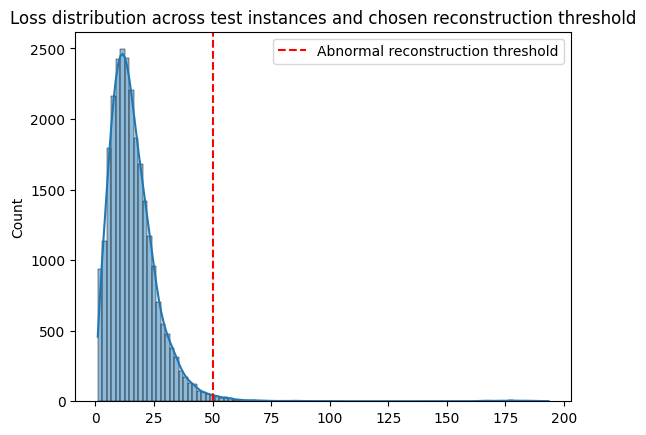

In [30]:
losses = eval_loss(model(data_test), data_test).sum(axis=1).detach().cpu().numpy()

threshold = 50 # This is set visually
sns.histplot(losses, bins=100, kde=True)
plt.axvline(x=threshold, color='r', linestyle='--', label='Abnormal reconstruction threshold')
plt.title('Loss distribution across test instances and chosen reconstruction threshold')
plt.legend()
plt.show()

In [31]:
mask = losses > threshold
outliers = data_test[mask]
print(outliers.shape)
plot_reconstructions_conv_autoencoder(model, outliers)

Output hidden; open in https://colab.research.google.com to view.

We get much more different types of corrupted instances than with the basic autoencoder (negative images, 4 images in a row...) which is good news. However, we also detect a significant number of non-corrupted images.

At this stage, we decided to try two different techniques:
- A GAN
- A VAE, hoping that the higher reconstruction quality compared to a normal autoencoder would enable to better distinguish corrupted and non corrupted instances


## 4. GANs

For GANs our idea was the following:
- Use the non-corrupted EMNIST dataset for training
- Use the trained discriminator for identifying the corrupted instances on the corrupted dataset
The rationale was that, if we got a high quality generator and discriminator on the non-corrupted dataset, it would be then easy for the discriminitor to identify "unpure" instances on the corrupted dataset.

However, this approach perhaps because of implementation issues on our side, this approach was not succesful.

For our GAN implementation, we mainly relied on the takeaways of this [article](https://arxiv.org/abs/1511.06434), especially of the activation functions (Tanh output for generator, Leaky ReLU instead of ReLU for discriminator...).

We started with a relatively simple GAN and then tried a more sophisticated architecture.

The first step was to load the true EMNIST and adapt it to the corrupted one, by resizing 28 x 28 to 32 x 32 pixels. To increase the image quality, we opted for padding rather than interpolation as this last technique seemed to be blurring the images.

In [34]:
import pandas as pd

def load_true_emnist(filename='data/emnist-balanced-train.parquet'):
    """
    Load the true Train EMNIST dataset that was downloaded beforehand.

    Args:
        filename (str): The name of the .csv file to read.

    Returns:
        numpy.ndarray: The images.
        numpy.ndarray: The labels.
    """
    data = pd.read_parquet(filename)

    images = np.array(data.iloc[:, 1:])
    images = images.reshape(-1, 28, 28) / 255

    labels = np.array(data.iloc[:, 0])
    return images, labels

emnist_data, _ = load_true_emnist()


# Prepare true emnist data for GAN training
from torch.utils.data import DataLoader
import torchvision.transforms as transforms

pad_transform = transforms.Compose([
    transforms.Pad(2),  # Resize to 32x32
    transforms.Normalize((0.5,), (0.5,)) # Normalize to [-1, 1] for the GAN training (improves stability)
])


emnist_tensor = torch.tensor(emnist_data, device=device, dtype=torch.float32)
emnist_tensor = emnist_tensor.unsqueeze(1)
resize_emnist = pad_transform(emnist_tensor).reshape(-1, 32 * 32)

emnist_data_loader = DataLoader(resize_emnist, batch_size=256, shuffle=True)
next(iter(emnist_data_loader)).shape

torch.Size([256, 1024])

In [35]:
class SimpleGenerator(nn.Module):
    def __init__(self, latent_dim=100):
        super(SimpleGenerator, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(latent_dim, 128),
            nn.ReLU(),
            nn.Linear(128, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 32 * 32),    # Map to image size
            nn.Tanh()                   # Normalize output to [-1, 1]
        )

    def forward(self, z):
        img = self.model(z)
        return img.view(-1, 1, 32, 32)

class SimpleDiscriminator(nn.Module):
    def __init__(self):
        super(SimpleDiscriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Flatten(),
            nn.Linear(32 * 32, 512),
            nn.LeakyReLU(),
            nn.Linear(512, 256),
            nn.LeakyReLU(),
            nn.Linear(256, 128),
            nn.LeakyReLU(),
            nn.Linear(128, 1),
            nn.Sigmoid()               # Output probability of being real
        )

    def forward(self, img):
        return self.model(img)

In [40]:
simple_generator = SimpleGenerator().to(device)
simple_discriminator = SimpleDiscriminator().to(device)

optimizer_G = torch.optim.Adam(simple_generator.parameters(), lr=1e-4)
optimizer_D = torch.optim.Adam(simple_discriminator.parameters(), lr=1e-4)

criterion = nn.BCELoss()

In [45]:
num_epochs = 30 # We had trained 50 before so 80 epochs in total
batch_size = 256
latent_dim = 100

# Training
for epoch in range(num_epochs):
    for real_imgs in emnist_data_loader:

        # Train Discriminator
        real_labels = torch.ones(real_imgs.size(0), 1).to(device)
        fake_labels = torch.zeros(real_imgs.size(0), 1).to(device)

        optimizer_D.zero_grad()
        outputs_real = simple_discriminator(real_imgs)
        loss_real = criterion(outputs_real, real_labels)

        z = torch.randn(real_imgs.size(0), latent_dim).to(device)
        fake_imgs = simple_generator(z)
        outputs_fake = simple_discriminator(fake_imgs.detach())
        loss_fake = criterion(outputs_fake, fake_labels)


        loss_D = loss_real + loss_fake
        loss_D.backward()
        optimizer_D.step()

        # Train Generator
        optimizer_G.zero_grad()
        outputs = simple_discriminator(fake_imgs)
        loss_G = criterion(outputs, real_labels)
        loss_G.backward()
        optimizer_G.step()

    print(f"Epoch [{epoch}/{num_epochs}] Loss D: {loss_D.item()}, Loss G: {loss_G.item()}")


Epoch [0/30] Loss D: 0.13710778951644897, Loss G: 4.6963677406311035
Epoch [1/30] Loss D: 0.22982998192310333, Loss G: 4.047390937805176
Epoch [2/30] Loss D: 0.26036879420280457, Loss G: 4.378905296325684
Epoch [3/30] Loss D: 0.28368520736694336, Loss G: 4.099451541900635
Epoch [4/30] Loss D: 0.17868326604366302, Loss G: 2.8108303546905518
Epoch [5/30] Loss D: 0.1789185255765915, Loss G: 3.4604766368865967
Epoch [6/30] Loss D: 0.13022162020206451, Loss G: 4.4459099769592285
Epoch [7/30] Loss D: 0.16622895002365112, Loss G: 3.7209789752960205
Epoch [8/30] Loss D: 0.2786789834499359, Loss G: 3.344195604324341
Epoch [9/30] Loss D: 0.2172894924879074, Loss G: 3.1400699615478516
Epoch [10/30] Loss D: 0.29632434248924255, Loss G: 4.063016414642334
Epoch [11/30] Loss D: 0.245053231716156, Loss G: 4.339958190917969
Epoch [12/30] Loss D: 0.293546199798584, Loss G: 3.0430409908294678
Epoch [13/30] Loss D: 0.14575782418251038, Loss G: 3.7012622356414795
Epoch [14/30] Loss D: 0.2982950806617737, L

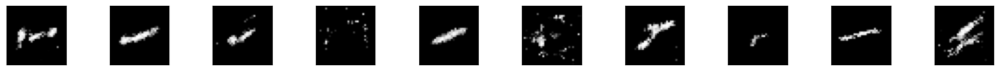

In [46]:
# Trying the generator

z = torch.randn(10, latent_dim).to(device)
fake_imgs = simple_generator(z)
plot_images(fake_imgs.detach().cpu().numpy())

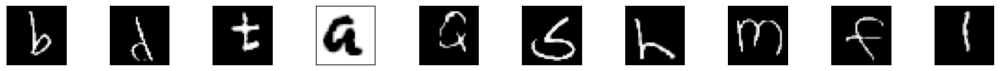

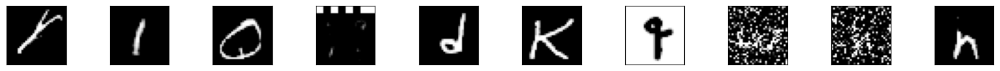

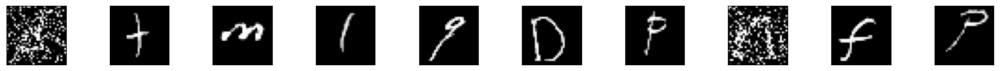

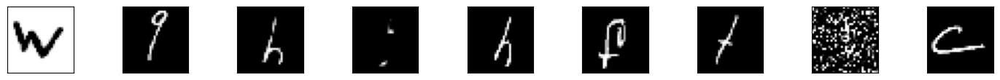

In [52]:
# The generator results are not very convincing, let's try the discriminator on the corrupted dataset

idx = np.random.randint(0, len(corrupted_emnist_nn), 1000)
corrupted_imgs = (corrupted_emnist_nn[idx] - 0.5) * 2 # Normalize to fit was was done to true emnist
corrupted_imgs = corrupted_imgs.reshape(-1, 1, 32, 32)

# We will ony vizualize the images for which the generator is certain that they are fake images (probability lower than 0.1)
probs = simple_discriminator(corrupted_imgs).flatten().detach().cpu().numpy()
plot_images(corrupted_imgs[probs < 0.1])

These results are interesting (there are some corrupted instances) but the performance is overall well below the results of the autoencoder, which was besides much faster to train.

At this stage, we tried implementing a convolutional GAN following the DCGAN architecture (see the paper quoted above) and basing ourselves on [this PyTorch implementation](https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html). However, this was difficult to implement (passing 3 channels to 1 channels and changing the input sizes caused us a lot of dimension problems in the convolution layers) and the final results were not very convincing. We therefore stopped with the GANs for this problem and decided to come back to autoencoders with a more sophisticated approach, VAEs.

Other examples of GANs and convolutional GANs can be found in the part II of this notebook.

## 5. VAEs

We started with a relatively simple VAE implementation, taking inspiration from this [GitHub tutorial](https://github.com/Jackson-Kang/Pytorch-VAE-tutorial/tree/master) based on MNIST for the architecture.

In [53]:
class Encoder(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(Encoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, hidden_dim),
            nn.LeakyReLU(0.2)
        )
        self.fc_mean = nn.Linear(hidden_dim, latent_dim)
        self.fc_var = nn.Linear(hidden_dim, latent_dim)

    def forward(self, x):
        h = self.encoder(x)
        mean = self.fc_mean(h)
        log_var = self.fc_var(h)
        return mean, log_var


class Decoder(nn.Module):
    def __init__(self, latent_dim, hidden_dim, output_dim):
        super(Decoder, self).__init__()
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, hidden_dim),
            nn.LeakyReLU(0.2),
            nn.Linear(hidden_dim, output_dim),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.decoder(x)


class VAE(nn.Module):
    def __init__(self, input_dim, hidden_dim, latent_dim):
        super(VAE, self).__init__()
        self.encoder = Encoder(input_dim, hidden_dim, latent_dim)
        self.decoder = Decoder(latent_dim, hidden_dim, input_dim)

    @staticmethod
    def reparameterize(mean, log_var):
        epsilon = torch.randn_like(log_var)  # Sample noise
        return mean + epsilon * torch.exp(0.5 * log_var)  # Reparameterization trick

    def forward(self, x):
        mean, log_var = self.encoder(x)
        z = self.reparameterize(mean, log_var)
        x_hat = self.decoder(z)
        return x_hat, mean, log_var


In [71]:
import torch.nn.functional as F

# VAE loss function
def loss_function(x, x_hat, mean, log_var):
    reproduction_loss = F.binary_cross_entropy(x_hat, x, reduction='sum')
    kld = -0.5 * torch.sum(1 + log_var - mean.pow(2) - log_var.exp())
    return reproduction_loss + kld

In [72]:
# Training function

def train_vae(model, loss_fn, data_loader, epochs=10, optimizer=None):
    model.train()  #
    for epoch in range(epochs):
        total_loss = 0
        for batch_idx, data in enumerate(data_loader):

            optimizer.zero_grad()

            # Forward pass
            x_hat, mean, log_var = model(data)

            # Compute loss
            loss = loss_fn(data, x_hat, mean, log_var)
            total_loss += loss.item()

            # Backward pass and optimization
            loss.backward()
            optimizer.step()

            # Log progress
            if batch_idx % 100 == 0:
                print(
                    f"Train Epoch: {epoch+1} [{batch_idx * len(data)}/{len(data_loader.dataset)} "
                    f"({100. * batch_idx / len(data_loader):.0f}%)]\tLoss: {loss.item():.6f}"
                )

        print(f"====> Epoch: {epoch+1} Average loss: {total_loss / len(data_loader.dataset):.6f}")


In [77]:
input_dim = 32 * 32
hidden_dim = 512
latent_dim = 32

vae = VAE(input_dim, hidden_dim, latent_dim).to(device)
optimizer = torch.optim.Adam(vae.parameters(), lr=1e-3)
train_vae(vae, loss_function, data_loader=train_loader, epochs=20, optimizer=optimizer)

Train Epoch: 1 [0/104845 (0%)]	Loss: 181952.250000
Train Epoch: 1 [25600/104845 (24%)]	Loss: 74145.929688
Train Epoch: 1 [51200/104845 (49%)]	Loss: 66393.546875
Train Epoch: 1 [76800/104845 (73%)]	Loss: 57746.042969
Train Epoch: 1 [102400/104845 (98%)]	Loss: 51157.488281
====> Epoch: 1 Average loss: 257.343073
Train Epoch: 2 [0/104845 (0%)]	Loss: 52493.171875
Train Epoch: 2 [25600/104845 (24%)]	Loss: 48473.722656
Train Epoch: 2 [51200/104845 (49%)]	Loss: 47217.421875
Train Epoch: 2 [76800/104845 (73%)]	Loss: 44766.386719
Train Epoch: 2 [102400/104845 (98%)]	Loss: 45658.269531
====> Epoch: 2 Average loss: 184.248092
Train Epoch: 3 [0/104845 (0%)]	Loss: 45656.242188
Train Epoch: 3 [25600/104845 (24%)]	Loss: 43143.156250
Train Epoch: 3 [51200/104845 (49%)]	Loss: 44415.671875
Train Epoch: 3 [76800/104845 (73%)]	Loss: 43395.007812
Train Epoch: 3 [102400/104845 (98%)]	Loss: 43368.132812
====> Epoch: 3 Average loss: 171.580610
Train Epoch: 4 [0/104845 (0%)]	Loss: 42586.046875
Train Epoch: 4 [

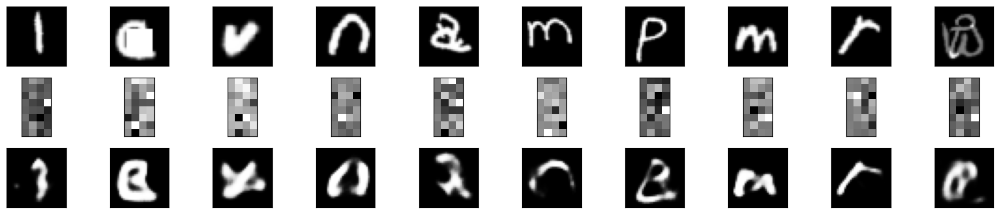

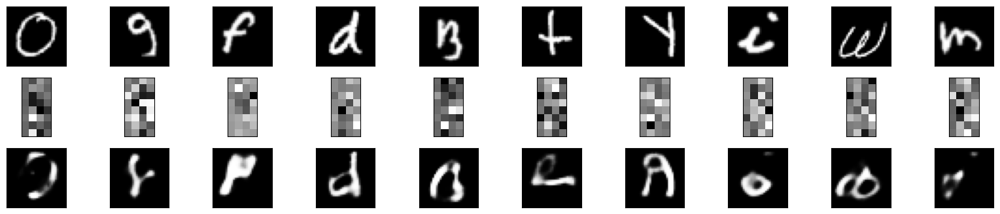

In [78]:
# Reconstruction plotting function for VAE (visualize mean vector)

def plot_reconstructions_vae(model, data, base_dim=32):
    true_imgs = data

    # Get the encodings and reconstructions from the VAE
    with torch.no_grad():
        mean, log_var = model.encoder(data)
        z = model.reparameterize(mean, torch.exp(0.5 * log_var))
        decoded_imgs = model.decoder(z)

    # Convert images for plotting
    true_imgs = to_img(true_imgs, base_dim=base_dim)
    decoded_imgs = to_img(decoded_imgs, base_dim=base_dim)
    # For VAE, we'll show the mean values of the latent space
    encoded_imgs = mean.cpu().data.numpy()

    n = 10  # Number of images to display at the same time
    for j in range(0, len(data), 10):
        plt.figure(figsize=(20, 4))
        for i in range(n):
            if i+j >= len(data):
                break
            # Display original images
            ax = plt.subplot(3, n, i + 1)
            plt.imshow(true_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display encoded representations (mean values)
            ax = plt.subplot(3, n, i + 1 + n)
            plt.imshow(encoded_imgs[i + j].reshape(-1, 4))
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # Display reconstructed images
            ax = plt.subplot(3, n, i + 1 + 2 * n)
            plt.imshow(decoded_imgs[i + j])
            plt.gray()
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

data_viz = next(iter(test_loader))[:20]
plot_reconstructions_vae(vae, data_viz)

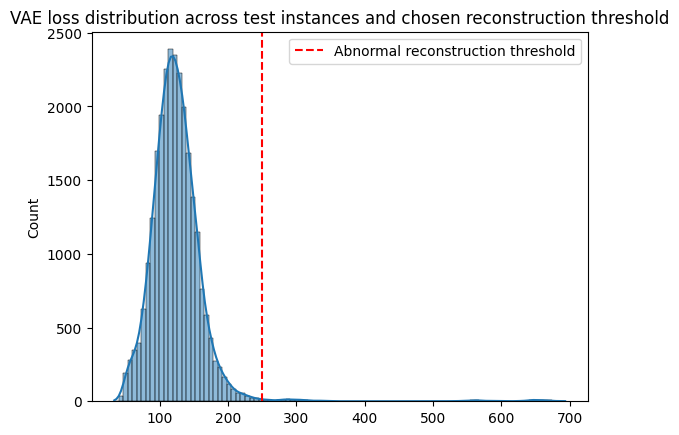

In [91]:
# We seem to be getting similar results to the normal autoencoder
# Let's visualize again the errors (basing ourselves only on the reconstruction loss)

with torch.no_grad():
    x_hat, mean, log_var = vae(data_test)
    reconstruction_loss = nn.functional.binary_cross_entropy(x_hat, data_test, reduction='none').sum(dim=1).cpu().numpy()

# Threshold chosen visually (we could also have used 1% top percentile)
threshold = 250
sns.histplot(reconstruction_loss, bins=100, kde=True)
plt.axvline(x=threshold, color='r', linestyle='--', label='Abnormal reconstruction threshold')
plt.title('VAE loss distribution across test instances and chosen reconstruction threshold')
plt.legend()
plt.show()

Number of detected outliers: 212


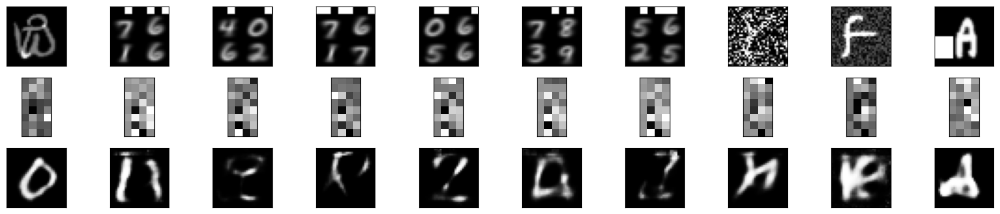

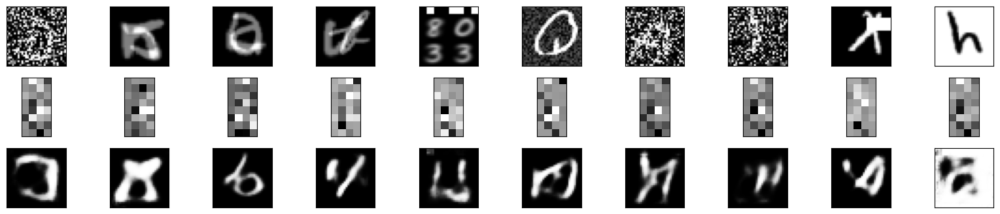

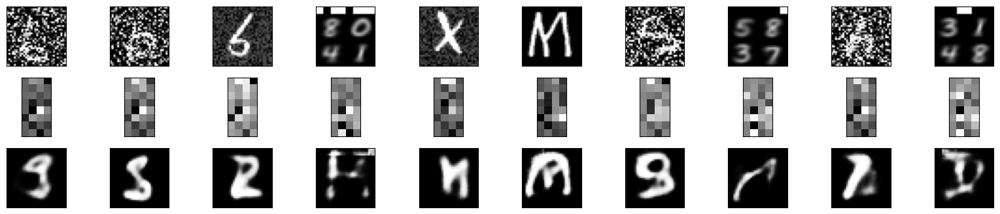

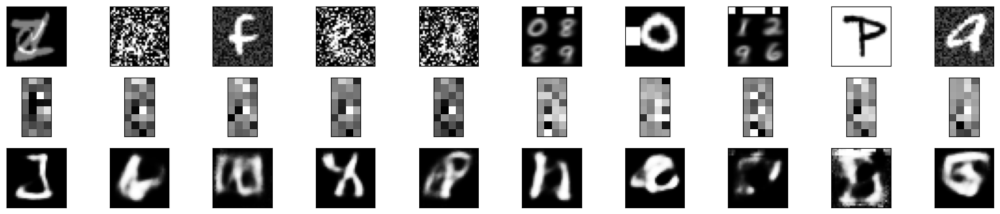

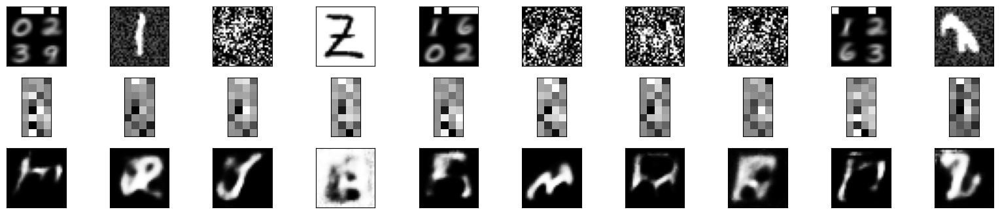

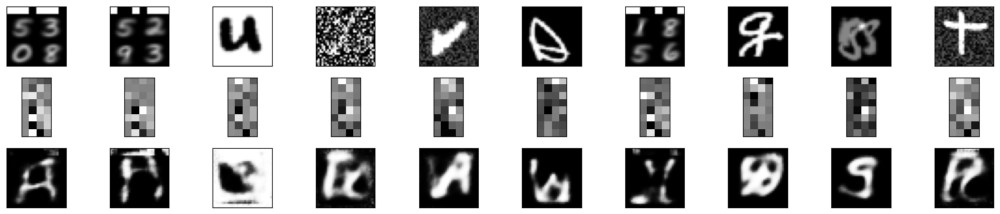

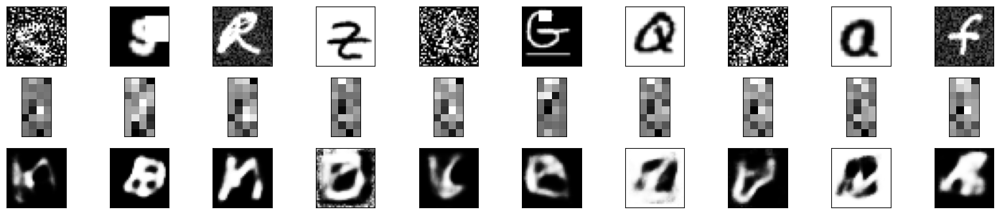

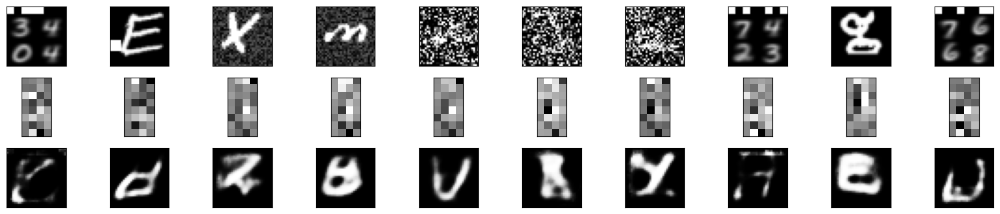

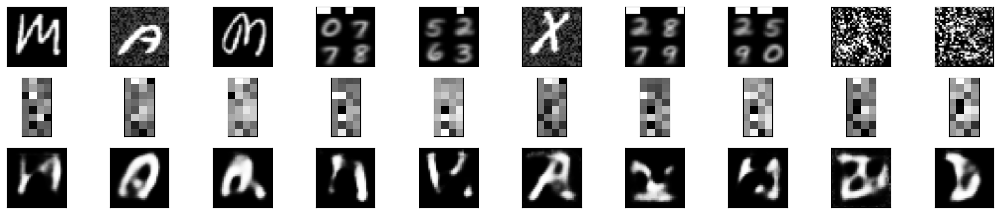

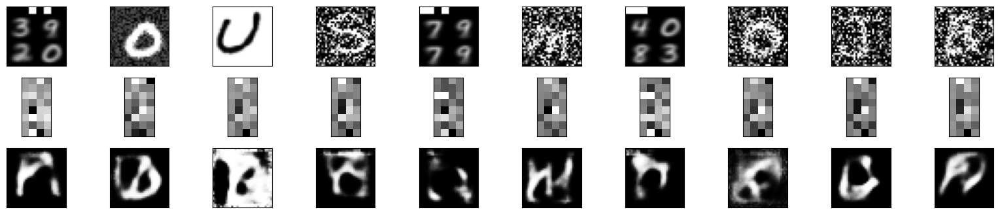

In [96]:
mask = reconstruction_loss > threshold
print(f"Number of detected outliers: {mask.sum()}")
outliers = data_test[mask][:100]
plot_reconstructions_vae(vae, outliers)

These results are very encouraging. The instances identified are almost all corrupted and they come from all types of corruption: negative images, "4 in 1 images", noisy images, white-square-added images and interpolated images. Moreover, we see that the VAE is able to reconstruct quite well the images to which some noise was added.

We also see that we get about 1% outliers, which is in line with what we had roughly estimated.

Depending on the task and our objective, we can adjust the threshold: if the objective is to remove only true outliers, we can set the threshold higher (and risk keeping some corrupted data), whereas if it is to remove all corrupted data at all cost, we could set it lower and risk removing true data. We could thus stop at this point.

At this stage, we also tried a convolutational VAE hoping, similarly to before, that it would improve our performance. The architecture is given below is inspired from this [GitHub implementation](https://github.com/sksq96/pytorch-vae/tree/master) (itself inspired from [this article](https://arxiv.org/pdf/1803.10122)).
However, this architecture did not improve our results and, on the contrary, seemed to have more false positives, so we decided to explore a different direction.

In [ ]:
# Architecture we used for the convolutional VAE

class Encoder(nn.Module):
    def __init__(self, input_dim=1024, h_dim=1024, latent_dim=32):
        super(Encoder, self).__init__()
        self.img_size = int(np.sqrt(input_dim))

        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.ReLU(),
            nn.Flatten()
        )

        # Calculate the size after convolutions
        conv_size = 256 * (self.img_size//(2**4)) * (self.img_size//(2**4))

        self.FC_mean = nn.Linear(conv_size, latent_dim)
        self.FC_var = nn.Linear(conv_size, latent_dim)

    def forward(self, x):
        if len(x.shape) == 2:
            x = x.view(-1, 1, self.img_size, self.img_size)
        h = self.encoder(x)
        mean = self.FC_mean(h)
        log_var = self.FC_var(h)
        return mean, log_var

class Decoder(nn.Module):
    def __init__(self, input_dim=1024, h_dim=1024, latent_dim=32):
        super(Decoder, self).__init__()
        self.img_size = int(np.sqrt(input_dim))

        # Calculate the size needed for reshape
        self.init_size = self.img_size//(2**4)
        self.conv_size = 256 * self.init_size * self.init_size

        self.FC_hidden = nn.Linear(latent_dim, self.conv_size)

        self.decoder = nn.Sequential(
            Reshape(-1, 256, self.init_size, self.init_size),
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid(),
        )

    def forward(self, x):
        h = self.FC_hidden(x)
        x_hat = self.decoder(h)
        return x_hat.view(-1, self.img_size * self.img_size)


class Model(nn.Module):
    def __init__(self, Encoder, Decoder):
        super(Model, self).__init__()
        self.Encoder = Encoder
        self.Decoder = Decoder

    def reparameterization(self, mean, var):
        epsilon = torch.randn_like(var).to(device)
        z = mean + var*epsilon
        return z

    def forward(self, x):
        mean, log_var = self.Encoder(x)
        z = self.reparameterization(mean, torch.exp(0.5 * log_var))
        x_hat = self.Decoder(z)
        return x_hat, mean, log_var

 ## 6. Working on the latent space

Given the satisfactory results of the VAE, we decided to stop trying new architectures and rather try to use the latent space. Our reasoning was the following: given that they are acceptably reconstructed, images radically different from the normal ones (ex: negatives) should be mapped to a very different latent space than the rest. Using unsupervised techniques on the latent space could therefore allow us to identify corrupted data that the reconstruction loss approach is missing because these instances are well-enough reconstructed.

We could have done this on the autoencoder directly but, as it was performing better, we decided to work on the learnt mean vector of the VAE's latent distribution space.

After a few trials, we opted for T-SNE as unsupervised learning technique, because it had the big advantage of making visualization easy. This was also motivated by the fact TSNE distinguishes quite well instances on the MNIST dataset. Other techniques we thought of were not as much adapted: K-Means would assume same-sized centroids, which was far from being the case for our corrupted instances, and Gaussian Mixture Models were too long to train and harder to visualize. For training times, we present the results only the test set but the same approach can be done on the whole dataset.

In [103]:
from sklearn.manifold import TSNE
import seaborn as sns

with torch.no_grad():
    mean, _ = vae.encoder(data_test)

tsne = TSNE(n_components=2, random_state=42, n_iter=600, verbose=2, n_jobs=-1)
data_tsne = tsne.fit_transform(mean.cpu().numpy())

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_t_sne.py:1162: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 26212 samples in 0.001s...
[t-SNE] Computed neighbors for 26212 samples in 7.365s...
[t-SNE] Computed conditional probabilities for sample 1000 / 26212
[t-SNE] Computed conditional probabilities for sample 2000 / 26212
[t-SNE] Computed conditional probabilities for sample 3000 / 26212
[t-SNE] Computed conditional probabilities for sample 4000 / 26212
[t-SNE] Computed conditional probabilities for sample 5000 / 26212
[t-SNE] Computed conditional probabilities for sample 6000 / 26212
[t-SNE] Computed conditional probabilities for sample 7000 / 26212
[t-SNE] Computed conditional probabilities for sample 8000 / 26212
[t-SNE] Computed conditional probabilities for sample 9000 / 26212
[t-SNE] Computed conditional probabilities for sample 10000 / 26212
[t-SNE] Computed conditional probabilities for sample 11000 / 26212
[t-SNE] Computed conditional probabilities for sample 12000 / 26212
[t-SNE] Computed conditional probabilities for sam

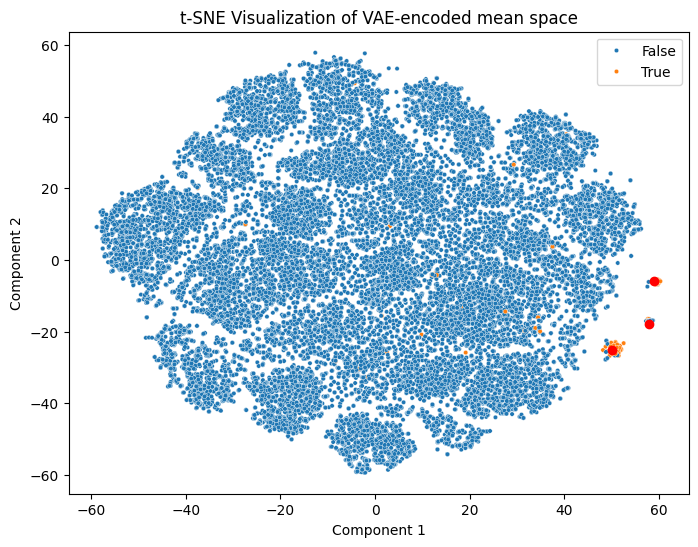

In [123]:
# We already have a mask with the instances with a high reconstruction loss
# Let's use to see if we can visualize the corrupted instances

plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_tsne[:, 0], y=data_tsne[:, 1], s=10, hue=mask)
plt.title('t-SNE Visualization of VAE-encoded mean space')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.scatter(50, -25, color="red")
plt.scatter(58, -18, color="red")
plt.scatter(59, -6, color="red")


plt.show()

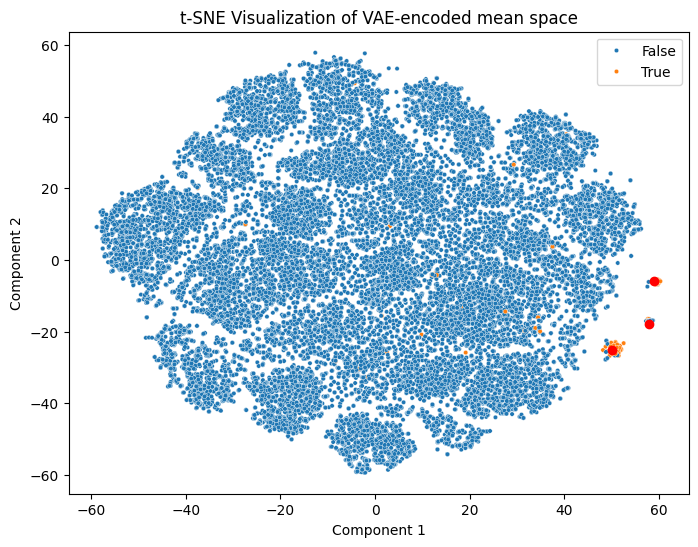

In [126]:
# Let's identify visualy the areas we want to target

center_1 = np.array([50, -25])
center_2 = np.array([58, -18])
center_3 = np.array([59, -6])

plt.figure(figsize=(8, 6))
sns.scatterplot(x=data_tsne[:, 0], y=data_tsne[:, 1], s=10, hue=mask)
plt.title('t-SNE Visualization of VAE-encoded mean space')
plt.xlabel('Component 1')
plt.ylabel('Component 2')
plt.scatter(center_1[0], center_1[1], color="red")
plt.scatter(center_2[0], center_2[1], color="red")
plt.scatter(center_3[0], center_3[1], color="red")

plt.show()

---
---
---
234


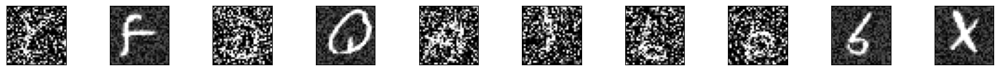

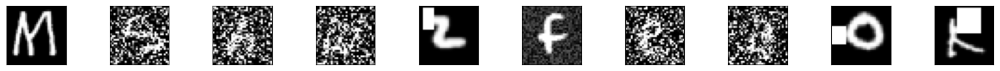

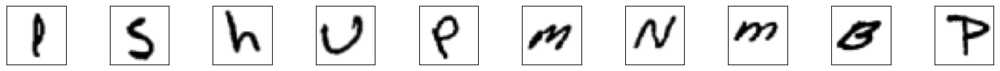

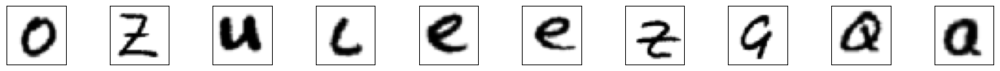

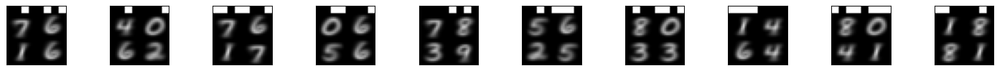

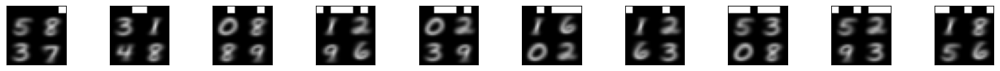

In [129]:
# Let's identify the elements close to these centroids

radius = 5
total_identified = 0

for center in [center_1, center_2, center_3]:
  mask_center = (data_tsne[:, 0] - center[0])**2 + (data_tsne[:, 1] - center[1])**2 < radius**2
  total_identified += mask_center.sum()
  plot_images(data_test[mask_center][:20])
  print("---")

print(total_identified)

We now have clusters, one of each corresponding to a type of corruption: added noise (mixed with interpolated), negative images, and  "4 in 1 images". This method enables us to identify more corrupted images than before, without any error appearingly, so it is very interesting.

However we are missing a lot of "added-white-square images", probably because these ones are closer to the non-corrupted images and can thus be encoded similarly to them. To go further, one idea would be to:
- First remove all the images corrupted in the ways identified here
- Then, given that the corrupted ones remaining are probably almost all "added-white-square" ones, we could use a denoising technique on them. For instance, adding white squares to all images and then use a denoising autoencoder on them. Unfortunately, we did not have time to implement this.

## Conlusion of Part I

We tried several unsupervised techniques to identify the corrupted instances: autoencoders and variational autoencoders through the reconstruction error, GANs through the discriminator, and traditional unsupervised ML techniques applied to the latent space.
Of these, the VAE seems to work particularly well, especially combined with the T-SNE identification of centroids in the latent space.

A few ideas we had to go further:
- "Reverse engineer" the observed corruptions: white squares, noise, or negative images are easy to replicate. We could have added these corruptions manually and then use a denoising model. These would be especially useful to denoise the corrupted instances.
- Leverage more the clean EMNIST dataset, for example by training a VAE on it and then applying it to the corrupted one. As the corrupted instances would never have been seen, it is possible that the results would have been better. However, we think our approach of working directly on the corrupted set is perhaps more authentic as, in real use cases, it is rare to have a clean dataset available besides the corrupted one.

At this stage, our solution removes arounds 1-1.5% of instances, and has a very high quality of removal, as almost all removed instances are corrupted ones. We are confident that, with the further ideas we identified, we could have gone higher. As mentionned above, the choice is then about the end objective: if it is to remove all corrupted instances and removing non-corrupted ones matters less, we could lower our thresholds to get more a higher rate of true negatives, but also more false positives.


# II. Explore Mode collapse for training a GAN on MNIST

This part of the notebook aims at studying mode collapsing when generating MNIST images using GANs.

The structure of the code was largely inspired by this notebook from the [pytorch tutorials on GANs with MNIST](https://github.com/yunjey/pytorch-tutorial/blob/master/tutorials/03-advanced/generative_adversarial_network/main.py) which can be found on github.

# 1. Set-up functions and imports

In [ ]:
# IMPORTS
import os
import torch
import torchvision
import torch.nn as nn
from torchvision import transforms
from torchvision.utils import save_image
from IPython.display import Image
from torch.nn.init import xavier_normal_
import matplotlib.pyplot as plt

In [ ]:
device = torch.device('mps')

In [ ]:
sample_dir = 'samples'
batch_size = 100

In [ ]:
# Create a directory if not exists
if not os.path.exists(sample_dir):
    os.makedirs(sample_dir)

## 1.1 Loading MNIST

#### 1.1.1 Loading MNIST, size 28

In [ ]:
transform_28 = transforms.Compose([
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.5],   # for greyscale
                                     std=[0.5])])

In [ ]:
# MNIST dataset
mnist_28 = torchvision.datasets.MNIST(root='./data/MNIST_28/',
                                   train=True,
                                   transform=transform_28,
                                   download=True)

In [ ]:
data_loader_28 = torch.utils.data.DataLoader(dataset=mnist_28,
                                          batch_size=batch_size,
                                          shuffle=True)

#### 1.1.2 Loading MNIST, size 64

In [ ]:
transform_64 = transforms.Compose([
                transforms.ToTensor(),
                transforms.Resize(64),
                transforms.Normalize(mean=[0.5],   # for greyscale
                                     std=[0.5])])

In [ ]:
# MNIST dataset
mnist_64 = torchvision.datasets.MNIST(root='./data/MNIST_64/',
                                   train=True,
                                   transform=transform_64,
                                   download=True)

In [ ]:
data_loader_64 = torch.utils.data.DataLoader(dataset=mnist_64,
                                          batch_size=batch_size,
                                          shuffle=True)

## 1.2 Useful Functions

In [ ]:
def denorm(x):
    """
    Function to denormalize the normalized outputs of the GANs
    """
    out = (x + 1) / 2
    return out.clamp(0, 1)

In [ ]:
def reset_grad(d_optimizer: torch.optim.Optimizer, g_optimizer: torch.optim.Optimizer):
    """
    Function to reset grad at each epoch in the training phase.
    """
    d_optimizer.zero_grad()
    g_optimizer.zero_grad()

In [ ]:
def train_normal_gan(
        G: nn.Sequential,
        D: nn.Sequential,
        d_optimizer: torch.optim.Optimizer,
        g_optimizer: torch.optim.Optimizer,
        data_loader: torch.utils.data.DataLoader,
        num_epochs: int,
        criterion: nn.modules.BCELoss,
        device: torch.device,
        batch_size: int,
        latent_size: int,
        sample_dir: str='samples'
    ):
    """
    Function to train a normal GAN on MNIST
    """
    # Start training
    total_step = len(data_loader)
    for epoch in range(num_epochs):
        for i, (images, _) in enumerate(data_loader):
            images = images.reshape(batch_size, -1).to(device)

            # Create the labels which are later used as input for the BCE loss
            real_labels = torch.ones(batch_size, 1).to(device)
            fake_labels = torch.zeros(batch_size, 1).to(device)

            # ================================================================== #
            #                      Train the discriminator                       #
            # ================================================================== #

            # Compute BCE_Loss using real images where BCE_Loss(x, y): - y * log(D(x)) - (1-y) * log(1 - D(x))
            # Second term of the loss is always zero since real_labels == 1
            outputs = D(images)
            d_loss_real = criterion(outputs, real_labels)
            real_score = outputs

            # Compute BCELoss using fake images
            # First term of the loss is always zero since fake_labels == 0
            z = torch.randn(batch_size, latent_size).to(device)
            fake_images = G(z)
            outputs = D(fake_images)
            d_loss_fake = criterion(outputs, fake_labels)
            fake_score = outputs

            # Backprop and optimize
            d_loss = d_loss_real + d_loss_fake
            reset_grad(d_optimizer=d_optimizer, g_optimizer=g_optimizer)
            d_loss.backward()
            d_optimizer.step()

            # ================================================================== #
            #                        Train the generator                         #
            # ================================================================== #

            # Compute loss with fake images
            z = torch.randn(batch_size, latent_size).to(device)
            fake_images = G(z)
            outputs = D(fake_images)

            # We train G to maximize log(D(G(z)) instead of minimizing log(1-D(G(z)))
            # For the reason, see the last paragraph of section 3. https://arxiv.org/pdf/1406.2661.pdf
            g_loss = criterion(outputs, real_labels)

            # Backprop and optimize
            reset_grad(d_optimizer=d_optimizer, g_optimizer=g_optimizer)
            g_loss.backward()
            g_optimizer.step()

            if (i+1) % 200 == 0:
                print('Epoch [{}/{}], Step [{}/{}], d_loss: {:.4f}, g_loss: {:.4f}, D(x): {:.2f}, D(G(z)): {:.2f}'
                    .format(epoch, num_epochs, i+1, total_step, d_loss.item(), g_loss.item(),
                            real_score.mean().item(), fake_score.mean().item()))

        # Save real images
        if (epoch+1) == 1:
            images = images.reshape(images.size(0), 1, 28, 28)
            save_image(denorm(images), os.path.join(sample_dir, 'real_images.png'))

        # Save sampled images
        fake_images = fake_images.reshape(fake_images.size(0), 1, 28, 28)
        save_image(denorm(fake_images), os.path.join(sample_dir, 'fake_images-{}.png'.format(epoch+1)))

In [ ]:
def fake_images_normal_gan(G: nn.Sequential, batch_size: int, latent_size: int, device: torch.device):
    G.eval()
    with torch.no_grad():
        z = torch.randn(batch_size, latent_size).to(device)
        fake_images = G(z)
        fake_images = fake_images.reshape(fake_images.size(0), 1, 28, 28)

    # plot
    plt.figure(figsize=(10, 10))
    for i in range(batch_size):
        plt.subplot(int(batch_size**0.5), int(batch_size**0.5), i + 1)
        plt.imshow(fake_images[i].squeeze(0).cpu().numpy(), cmap='gray')
        plt.axis('off')
    plt.show()

In [ ]:
def labels_init(batch_size: int, lab: bool, err: float):
    """
    Function to add some noise in the real labels given to the Discriminator to prevent mode-collapse
    """
    err_labels = int(batch_size*err)
    if lab==1:
        x = torch.cat((torch.ones((batch_size-err_labels,1)), torch.zeros((err_labels,1))), 0)
    else:
        x = torch.cat((torch.zeros((batch_size-err_labels,1)), torch.ones((err_labels,1))), 0)
    y = x[torch.randperm(batch_size)].to(device)
    return y

In [ ]:
def train_cnn_gan(
        G: nn.Sequential,
        D: nn.Sequential,
        d_optimizer: torch.optim.Optimizer,
        g_optimizer: torch.optim.Optimizer,
        data_loader: torch.utils.data.DataLoader,
        num_epochs: int,
        criterion: nn.modules.BCELoss,
        device: torch.device,
        batch_size: int,
        latent_size: int,
        sample_dir: str='samples',
        epsilon: float=0.0,
    ):
    """
    Function to train a CNN GAN on MNIST, with a possibility to use noisy labels to prevent mode-collapse (percentage
    of noisy labels introduced in both fake and real labels to the Discriminator is as large as epsilon).
    """
    # Start training
    total_step = len(data_loader)
    for epoch in range(num_epochs):
        for i, (images, _) in enumerate(data_loader):
            images = images.to(device)

            # Create the labels which are later used as input for the BCE loss, add noise if epsilon > 0
            real_labels = labels_init(batch_size, 1, epsilon)
            fake_labels = labels_init(batch_size, 0, epsilon)

            # ================================================================== #
            #                      Train the discriminator                       #
            # ================================================================== #

            # Compute BCE_Loss using real images where BCE_Loss(x, y): - y * log(D(x)) - (1-y) * log(1 - D(x))
            # Second term of the loss is always zero since real_labels == 1
            outputs = D(images).view(-1, 1)
            d_loss_real = criterion(outputs, real_labels)
            real_score = outputs

            # Compute BCELoss using fake images
            # First term of the loss is always zero since fake_labels == 0
            z = torch.randn(batch_size, latent_size, 1, 1).to(device)
            fake_images = G(z)
            outputs = D(fake_images).squeeze(1).squeeze(1)

            d_loss_fake = criterion(outputs, fake_labels)
            fake_score = outputs

            # Backprop and optimize
            d_loss = d_loss_real + d_loss_fake
            reset_grad(d_optimizer=d_optimizer, g_optimizer=g_optimizer)
            d_loss.backward()
            d_optimizer.step()

            # ================================================================== #
            #                        Train the generator                         #
            # ================================================================== #

            # Compute loss with fake images
            z = torch.randn(batch_size, latent_size, 1, 1).to(device)
            fake_images = G(z)
            outputs = D(fake_images).squeeze(1).squeeze(1)

            # We train G to maximize log(D(G(z)) instead of minimizing log(1-D(G(z)))
            # For the reason, see the last paragraph of section 3. https://arxiv.org/pdf/1406.2661.pdf
            g_loss = criterion(outputs, real_labels)

            # Backprop and optimize
            reset_grad(d_optimizer=d_optimizer, g_optimizer=g_optimizer)
            g_loss.backward()
            g_optimizer.step()

            if (i+1) % 200 == 0:
                print('Epoch [{}/{}], Step [{}/{}], d_loss: {:.4f}, g_loss: {:.4f}, D(x): {:.2f}, D(G(z)): {:.2f}'
                    .format(epoch, num_epochs, i+1, total_step, d_loss.item(), g_loss.item(),
                            real_score.mean().item(), fake_score.mean().item()))

        # Save real images
        if (epoch+1) == 1:
            # images = images.reshape(images.size(0), 1, 28, 28)
            save_image(denorm(images), os.path.join(sample_dir, 'real_images.png'))

        # Save sampled images
        # fake_images = fake_images.reshape(fake_images.size(0), 1, 28, 28)
        fake_images = fake_images
        save_image(denorm(fake_images), os.path.join(sample_dir, 'fake_images-{}.png'.format(epoch+1)))

In [ ]:
def fake_images_cnn_gan(G: nn.Sequential, batch_size: int, latent_size: int, device: torch.device):
    G.eval()
    with torch.no_grad():
        z = torch.randn(batch_size, latent_size, 1, 1).to(device)
        fake_images = G(z)

    # plot
    plt.figure(figsize=(10, 10))
    for i in range(batch_size):
        plt.subplot(int(batch_size**0.5), int(batch_size**0.5), i + 1)
        plt.imshow(fake_images[i].squeeze(0).cpu().numpy(), cmap='gray')
        plt.axis('off')
    plt.show()

## 1.3 Useful Variables

In [ ]:
# "Normal" GAN hyperparameters
hidden_size = 256
image_size = 784

# CNN based GAN hyperparameters
filters_g = 64
filters_d = 64

# 2. Easy mode collapse: generating fake MNIST images using a "Normal" GAN

## 2.1. Model architecture

In [ ]:
latent_size = 64
num_epochs = 200

In [ ]:
# Discriminator
D = nn.Sequential(
    nn.Linear(image_size, hidden_size),
    nn.LeakyReLU(0.2),
    nn.Linear(hidden_size, hidden_size),
    nn.LeakyReLU(0.2),
    nn.Linear(hidden_size, 1),
    nn.Sigmoid()
)

In [ ]:
# Generator
G = nn.Sequential(
    nn.Linear(latent_size, hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size, hidden_size),
    nn.ReLU(),
    nn.Linear(hidden_size, image_size),
    nn.Tanh()
)

In [ ]:
# Device setting
D = D.to(device)
G = G.to(device)

In [ ]:
# Binary cross entropy loss and optimizer
criterion = nn.BCELoss()
d_optimizer = torch.optim.Adam(D.parameters(), lr=0.0002)
g_optimizer = torch.optim.Adam(G.parameters(), lr=0.0002)

## 2.2. Loading vs Training the GAN

### 2.2.1 Loading

Use these cells to use the model we pre-trained instead of training for a long time.

In [ ]:
# Load the checkpoint files
d_checkpoint = torch.load('models/D_normal.ckpt', weights_only=True)
g_checkpoint = torch.load('models/G_normal.ckpt', weights_only=True)

# Load the weights into the models
D.load_state_dict(d_checkpoint)
G.load_state_dict(g_checkpoint)

print("Models successfully loaded!")

Models successfully loaded!


### 2.2.2 Training

Use these cells if you want to actually train.

In [ ]:
train_normal_gan(G, D, d_optimizer, g_optimizer, data_loader_28, num_epochs, criterion, device, batch_size, latent_size, sample_dir="samples/normal_gan")

In [ ]:
# don't forget to save this beautiful model
torch.save(G.state_dict(), 'models/G_normal_gan.ckpt')
torch.save(D.state_dict(), 'models/D_normal_gan.ckpt')

## 2.3 Images and Analysis

### 2.3.1 Evolution through epochs

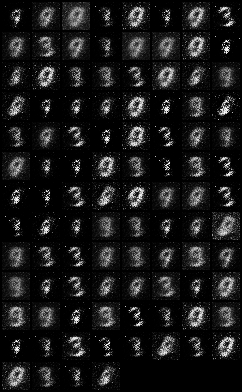

In [ ]:
Image('./samples/normal_gan/fake_images-10.png') # Epoch 10

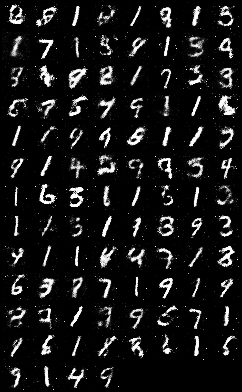

In [ ]:
Image('./samples/normal_gan/fake_images-100.png') # Epoch 100

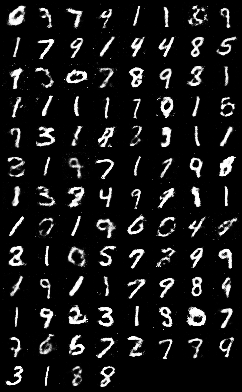

In [ ]:
Image('./samples/normal_gan/fake_images-200.png') # Epoch 200

### 2.3.2 Analysis

You can have fun with the cells below and generate some random images:

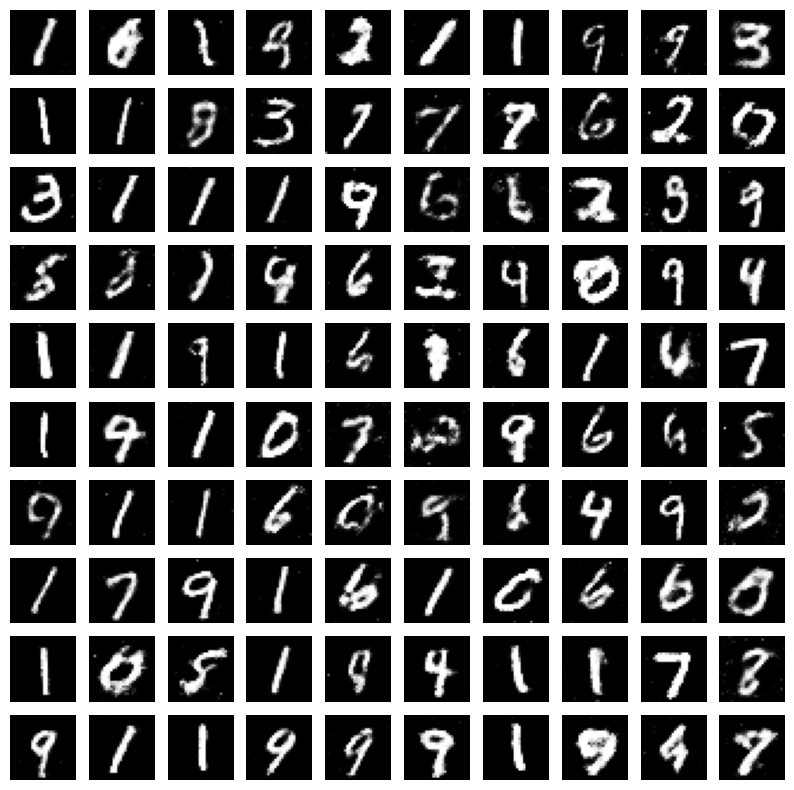

In [ ]:
fake_images_normal_gan(G, batch_size, latent_size, device)

Although this GAN has a simple architecture, it performs quite well. However, it gives us a good example of what mode collapse is: the generator tends to overproduce images that are easy to produce in comparison of their true distribution, because they enable it to fool the discriminator easily. Here, 1s and 9s are overly present, at the expense of images that are harder to generate (because more complex), such as 2s, 3s or 5s.

# 3. Mode collapse in GAN using MNIST and Convolution Layers

The structure of the GAN was taken from [this GitHub repository](https://github.com/rohitpatwa/gans-mode-collapse/tree/main), which explores different aspects of mode collapse. As in the part I of this notebook, it uses the DCGAN architecture.

We were hoping that a more complex architecture would enable us to limit the mode collapse phenomenon. On the contrary, it made it worse.

## 3.1 Model architecture

In [ ]:
latent_size = 64
num_epochs = 25

In [ ]:
# Generator
G = nn.Sequential(
    nn.ConvTranspose2d(latent_size, filters_g * 8, 4, 1, 0, bias=False),
    nn.BatchNorm2d(filters_g * 8),
    nn.LeakyReLU(inplace=True),

    nn.ConvTranspose2d(filters_g * 8, filters_g * 4, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_g * 4),
    nn.LeakyReLU(inplace=True),

    nn.ConvTranspose2d(filters_g * 4, filters_g * 2, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_g * 2),
    nn.LeakyReLU(inplace=True),

    nn.ConvTranspose2d(filters_g * 2, filters_g, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_g),
    nn.LeakyReLU(inplace=True),

    nn.ConvTranspose2d(filters_g, 1, 4, 2, 1, bias=False),
    nn.Tanh()
)

In [ ]:
# Discriminator
D = nn.Sequential(
    nn.Conv2d(1, filters_d, 4, 2, 1, bias=False),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(filters_d, filters_d * 2, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_d * 2),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(filters_d * 2, filters_d * 4, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_d * 4),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(filters_d * 4, filters_d * 8, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_d * 8),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(filters_d * 8, 1, 4, 1, 0, bias=False),
    nn.Sigmoid()
)

In [ ]:
# Device setting
D = D.to(device)
G = G.to(device)

In [ ]:
# Binary cross entropy loss and optimizer
criterion = nn.BCELoss()
d_optimizer = torch.optim.Adam(D.parameters(), lr=0.0002)
g_optimizer = torch.optim.Adam(G.parameters(), lr=0.0002)

## 3.2. Loading vs Training the GAN

### 3.2.1 Loading

To load instead of training.

In [ ]:
# Load the checkpoint files
d_checkpoint = torch.load('models/D_cnn_collapse.ckpt', weights_only=True, map_location=device)
g_checkpoint = torch.load('models/G_cnn_collapse.ckpt', weights_only=True, map_location=device)

# Load the weights into the models
D.load_state_dict(d_checkpoint)
G.load_state_dict(g_checkpoint)

print("Models successfully loaded!")

Models successfully loaded!


### 3.2.2 Training

To train.

In [ ]:
train_cnn_gan(G, D, d_optimizer, g_optimizer, data_loader_64, num_epochs, criterion, device, batch_size, latent_size, sample_dir="samples/cnn_collapse_gan")

In [ ]:
# don't forget to save this beautiful model
torch.save(G.state_dict(), 'models/G_cnn_collapse.ckpt')
torch.save(D.state_dict(), 'models/D_cnn_collapse.ckpt')

## 3.3 Images and Analysis

### 3.3.1 Evolution through epochs

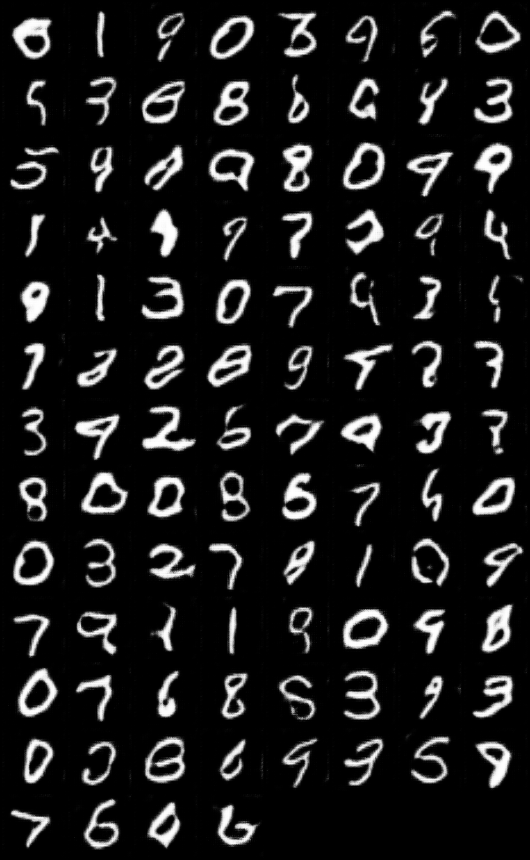

In [ ]:
Image('./samples/cnn_collapse_gan/fake_images-10.png') # Epoch 10

At first glance, the model seemed to learn quite well the digits, and the 10th epoch was much better than the 10th epoch of the more simpler model above.

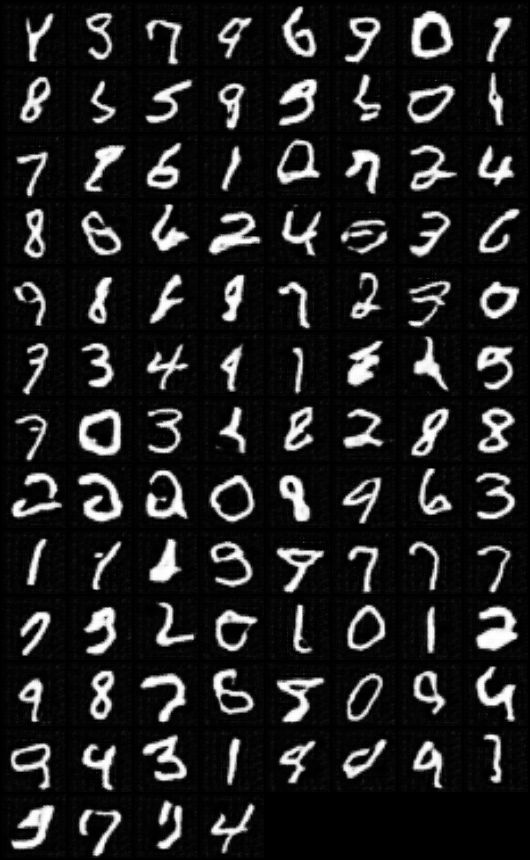

In [ ]:
Image('./samples/cnn_collapse_gan/fake_images-18.png') # Epoch 18

However, starting at epoch 19, the model seemed to start going off course.

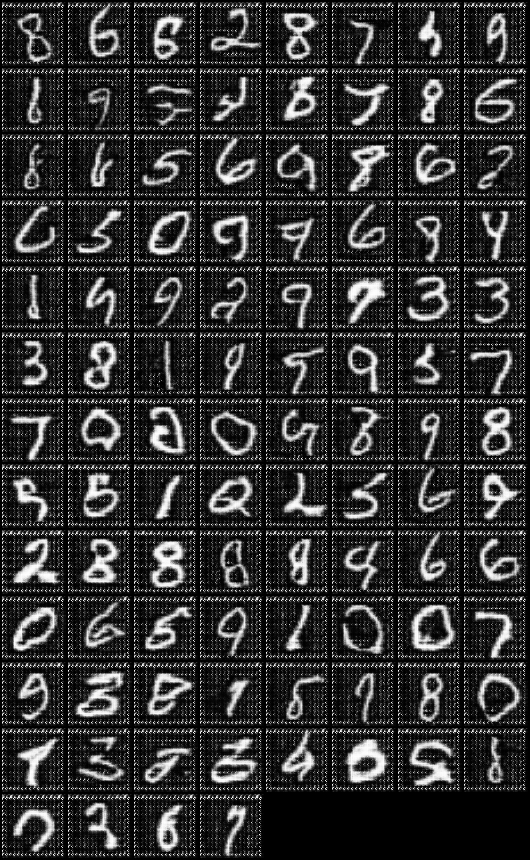

In [ ]:
Image('./samples/cnn_collapse_gan/fake_images-19.png') # Epoch 19

At epoch 20, the model had switched into a full collapse: the discriminator was not strong enough to penalize the generator and get out of this "saddle point" in the optimization process where the generator could just replicate the same pattern over and over and fool the discriminator.

Note that this "collapse" is not really a "mode collapse", where the generator tends to overproduce the easiest instances (the "mode"): here it just products non-sense.

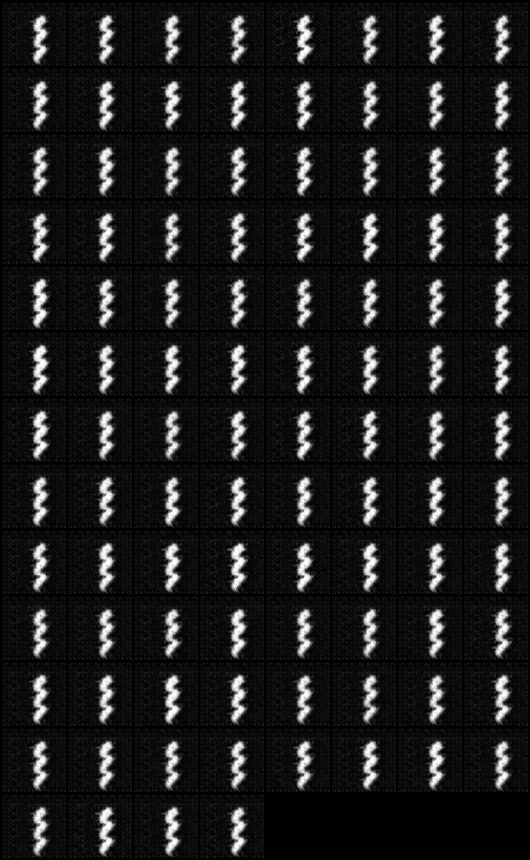

In [ ]:
Image('./samples/cnn_collapse_gan/fake_images-20.png') # Epoch 20

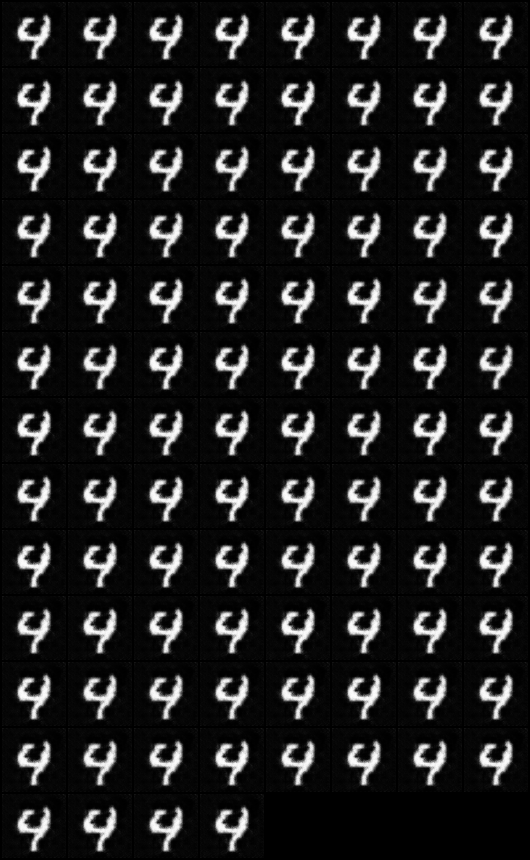

In [ ]:
Image('./samples/cnn_collapse_gan/fake_images-24.png') # Epoch 24

### 3.3.2 Analysis

You can have fun with the cells below and generate some random images:

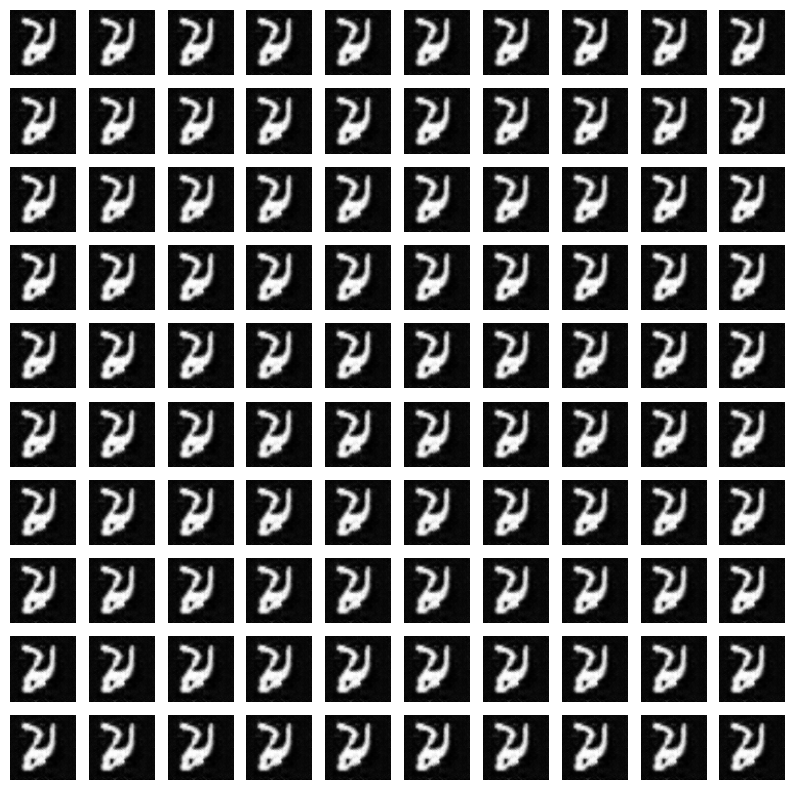

In [ ]:
fake_images_cnn_gan(G, batch_size, latent_size, device)

The model just keeps outputting the same image, which is not a number. We could have tried to solve this problem by investigating in depth and adding some regularisation techniques, or by reinforcing the discriminator at the expense of the generator (for instance, giving it a higher learning rate). However, we decided to rather try a different approach.

# 4. Avoiding mode collapse in GAN using MNIST and Convolution Layers

As a reminder, mode collapse in a GAN occurs when the generator learns to produce a limited variety of outputs that the discriminator consistently misclassifies as "real," neglecting the diversity of the data distribution. This happens due to the adversarial nature of GAN training, where the generator focuses too narrowly on fooling the discriminator rather than learning a complete representation of the data distribution.

The technique in question was inspired by these two papers according to the authors:
- [NIPS 2016 Tutorial: Generative Adversarial Networks by Ian Goodfellow](https://arxiv.org/pdf/1701.00160.pdf)
- [ON CONVERGENCE AND STABILITY OF GANS by Naveen Kodali, Jacob Abernethy, James Hays Zsolt Kira](https://arxiv.org/pdf/1705.07215.pdf)

The idea to prevent mode collapse is to avoid overfitting on the discriminator by adding noisy labels in the training procedure. This means that instead of giving all of the real data a real label (say $0$), we flip (by a factor of $\epsilon$) some of the real labels to the fake label (say $1$). Conversely, instead of giving all of the fake data a fake label (say $1$), we flip (by a factor of $\epsilon$) some of the fake labels to the real label (say $0$).

This technique is well known, and works for several reasons. First, this prevents the discriminator from becoming overly confident in distinguishing between real and fake data. Second, it encourages the generator to be more diverse and explore other subsets of the data, allowing for better coverage of the data distribution. Third, this technique simulates imperfections in real-world datasets, setting a more diverse environment and thus leading to a more robust GAN.

This implementation was inspired from the same repository as mentionned before.

## 4.1 Model architecture

In [ ]:
latent_size = 64
num_epochs = 30

In [ ]:
# Generator
G = nn.Sequential(
    nn.ConvTranspose2d(latent_size, filters_g * 8, 4, 1, 0, bias=False),
    nn.BatchNorm2d(filters_g * 8),
    nn.LeakyReLU(inplace=True),

    nn.ConvTranspose2d(filters_g * 8, filters_g * 4, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_g * 4),
    nn.LeakyReLU(inplace=True),

    nn.ConvTranspose2d(filters_g * 4, filters_g * 2, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_g * 2),
    nn.LeakyReLU(inplace=True),

    nn.ConvTranspose2d(filters_g * 2, filters_g, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_g),
    nn.LeakyReLU(inplace=True),

    nn.ConvTranspose2d(filters_g, 1, 4, 2, 1, bias=False),
    nn.Tanh()
)

In [ ]:
# Discriminator
D = nn.Sequential(
    nn.Conv2d(1, filters_d, 4, 2, 1, bias=False),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(filters_d, filters_d * 2, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_d * 2),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(filters_d * 2, filters_d * 4, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_d * 4),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(filters_d * 4, filters_d * 8, 4, 2, 1, bias=False),
    nn.BatchNorm2d(filters_d * 8),
    nn.LeakyReLU(negative_slope=0.2, inplace=True),

    nn.Conv2d(filters_d * 8, 1, 4, 1, 0, bias=False),
    nn.Sigmoid()
)

In [ ]:
# Device setting
D = D.to(device)
G = G.to(device)

In [ ]:
# Binary cross entropy loss and optimizer
criterion = nn.BCELoss()
d_optimizer = torch.optim.Adam(D.parameters(), lr=0.0002)
g_optimizer = torch.optim.Adam(G.parameters(), lr=0.0002)

## 4.2. Loading vs Training the GAN

### 4.2.1 Loading

To load.

In [ ]:
# Load the checkpoint files
d_checkpoint = torch.load('models/D_cnn_noisy.ckpt', weights_only=True, map_location=device)
g_checkpoint = torch.load('models/G_cnn_noisy.ckpt', weights_only=True, map_location=device)

# Load the weights into the models
D.load_state_dict(d_checkpoint)
G.load_state_dict(g_checkpoint)

print("Models successfully loaded!")

Models successfully loaded!


### 4.2.2 Training

To actually train.

In [ ]:
# DON'T FORGET EPSILON!!
train_cnn_gan(G, D, d_optimizer, g_optimizer, data_loader_64, num_epochs, criterion, device, batch_size, latent_size, sample_dir="samples/cnn_noisy_gan", epsilon=0.05)

In [ ]:
# don't forget to save this beautiful model
torch.save(G.state_dict(), 'models/G_cnn_noisy.ckpt')
torch.save(D.state_dict(), 'models/D_cnn_noisy.ckpt')

## 4.3 Images and Analysis

### 4.3.1 Evolution through epochs

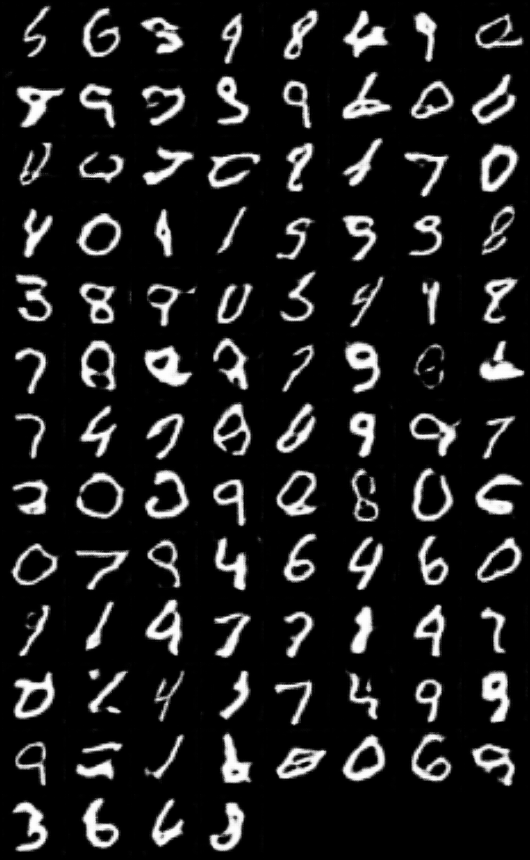

In [ ]:
Image('./samples/cnn_noisy_gan/fake_images-10.png') # Epoch 10

At the 10th epoch, it seems like the model has less well learned the representation of the data than the second model introduced in this notebook.

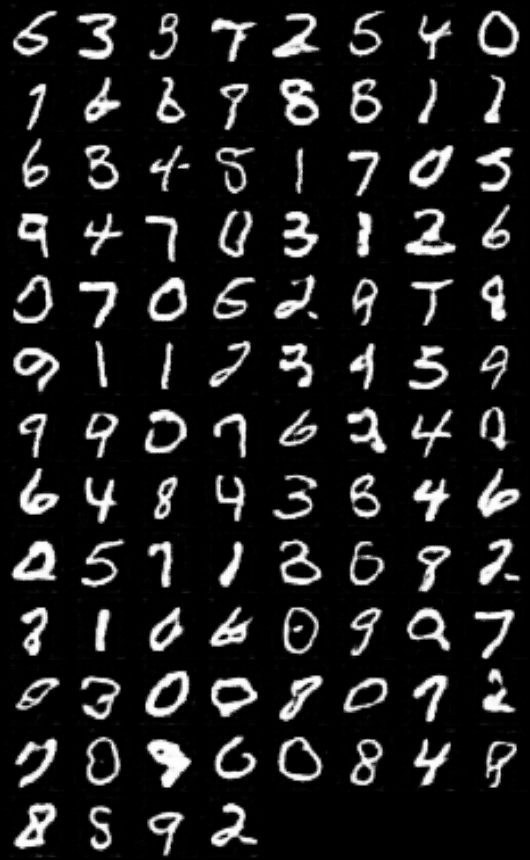

In [ ]:
Image('./samples/cnn_noisy_gan/fake_images-20.png') # Epoch 20

However, starting at epoch 20, the model has not gone off-course yet, and the representations seem quite good.

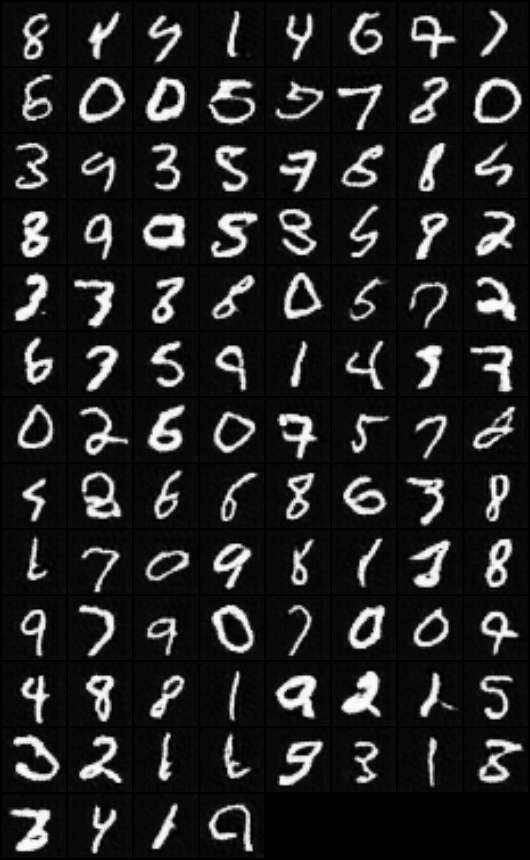

In [ ]:
Image('./samples/cnn_noisy_gan/fake_images-30.png') # Epoch 30

At epoch 30, the representations are really excellent, and we could train for even longer to get almost perfect images. Additionaly, the data seems very diverse, with not too many repetitions of digist that are easier to represent (like ones), which usually is the case.

### 4.3.2 Analysis

You can have fun with the cells below and generate some random images:

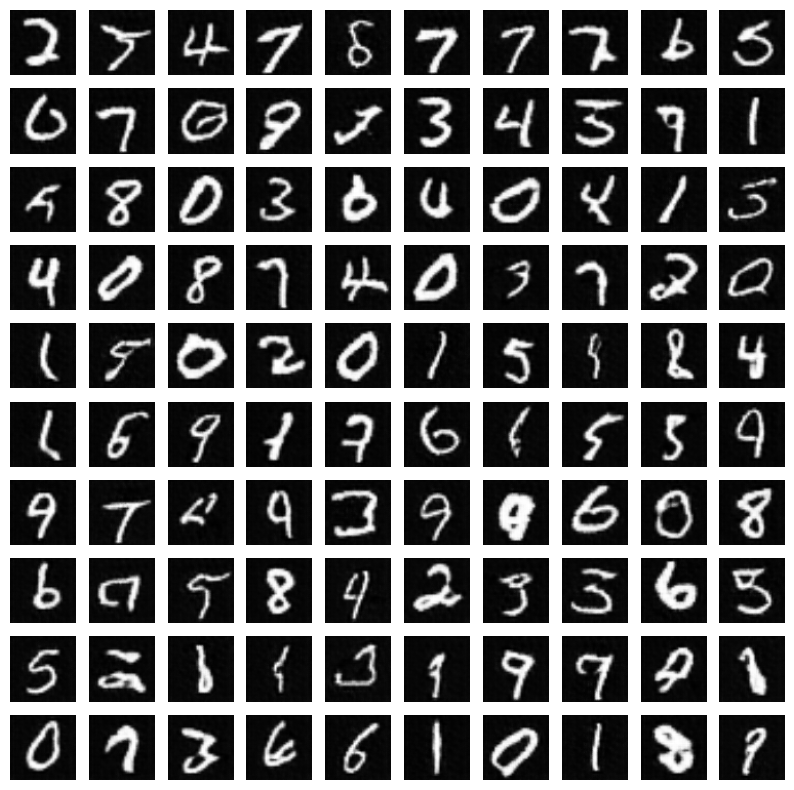

In [ ]:
fake_images_cnn_gan(G, batch_size, latent_size, device)

The generator does not converge towards a single, erroneous generation as before, which is encouraging. Moreover, the mode collapse phenomenom we were seeing with the first model is limited here: the proportion of 1s and 9s is visually lower than before, at the benefit of "harder digits", such at 2s and 3s. Interestingly however, it comes at the expense of digits of images of lower quality than before.

# 5. Conclusion

In conclusion, solving the mode collapse was harder than we initially  envisionned. More powerful models, relying on convolutionnal layers, made the problem much worse than initially. As GANs are quite unstable, and techniques like unbalancing the Discriminator over the Generator (and vice-versa) were really tricky to work with and we did not manage to solve the problem. Changing the hyperparameters (e.g. giving the Discriminator a high learning rate compared to the Generator) lead to similar conclusions.

We did not have time to implement metrics to catch mode collapse when needed, but our main ideas was to check for diversity between generated images (using the labels), and stop to the process at a threshold using this metric. Another metric could have been to check for noise generated, as we saw in the different GANs used that sometimes the model collapsed by just outputting some noise at the center of the image.

Finally, we quickly investigated techniques like Wasserstein distance-based GANs and InfoGANs (i.e. conditional GANs), which appeared to bring stability, but we did not have enough time to explore them in depth and to present them here.

# 6. BONUS - Generator art Gallery

Is it Wall-e?

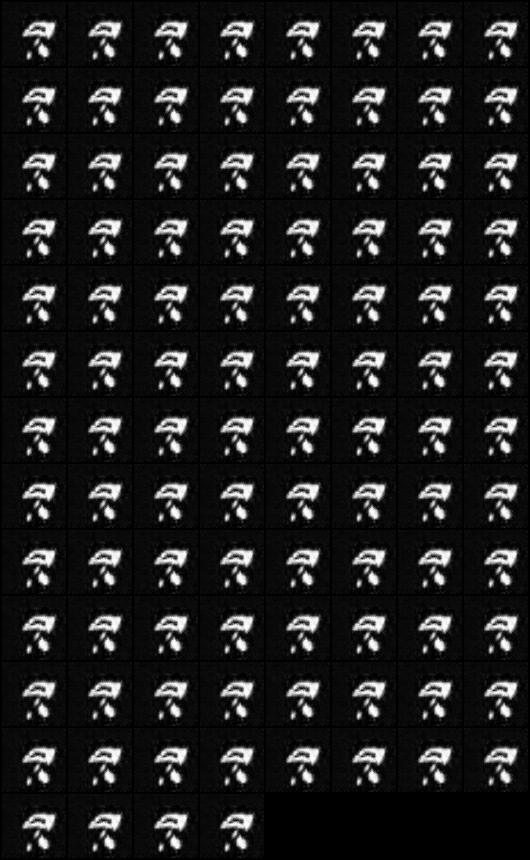

In [ ]:
Image('./samples/cnn_collapse_gan/fake_images-25.png') # Epoch 25

Tire-bouchon?

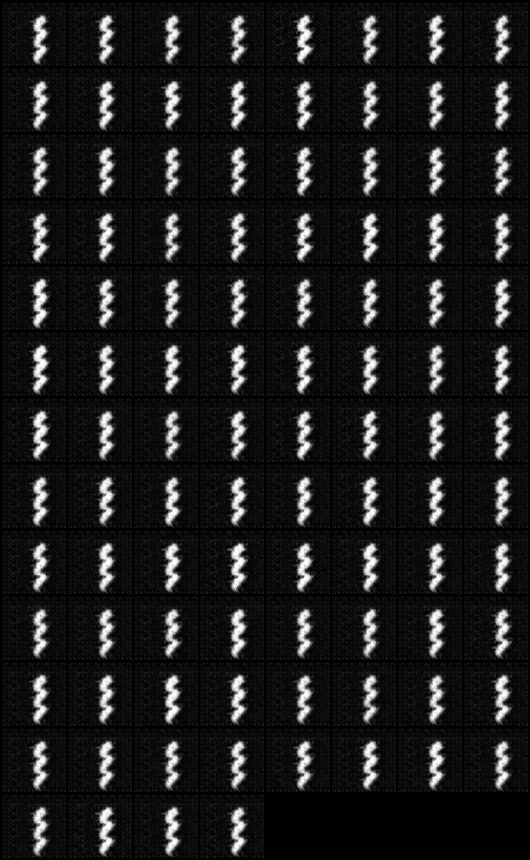

In [ ]:
Image('./samples/cnn_collapse_gan/fake_images-20.png') # Epoch 20

Dragonnet? Iguane? Lézard?

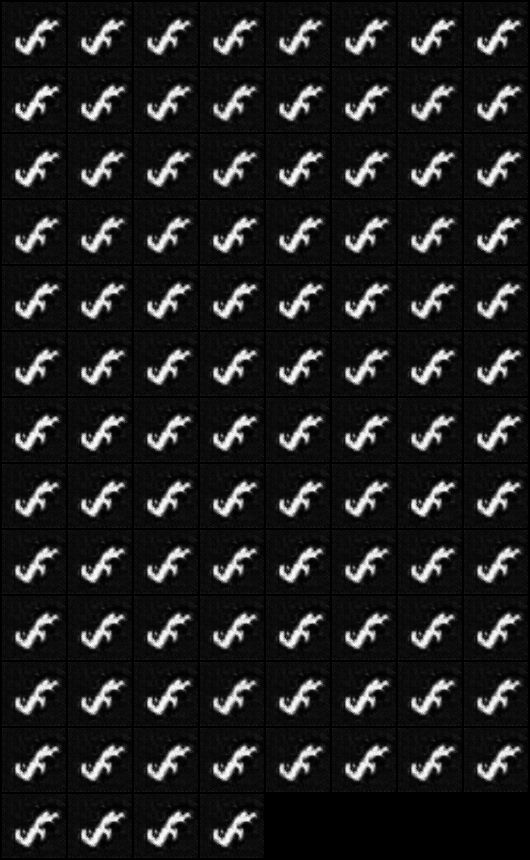

In [ ]:
Image('./samples/cnn_collapse_gan/fake_images-23.png') # Epoch 23